# 프로젝트

## 목적

몇년 전부터 혼밥, 혼술, 혼행 등 혼자 하는 콘텐츠가 많아지고 있는 추세입니다. 이 중, 혼행(혼자 여행)에 초점을 맞춰 혼행족들이 선호하는 여행지를 살펴보고 그 여행지가 가지는 특징을 살펴보고자 합니다. 분석한 결과를 바탕으로 혼행이 아니더라도 여행을 계획하는 사람들에게 사용자 선호도에 부합한 여행지를 추천해주는 협업 필터링도 구현하고자 합니다.

## 데이터

* 데이터 : 네이버 블로그 본문 1000개 (네이버 API를 통한 크롤링)

    
* 검색어 : '국내여행 +혼자 -가족,친구'

    
* 검색방식 : 정확도 기반 검색

# 라이브러리

In [1]:
import pandas as pd
import numpy as np
from collections import Counter # 갯수 파악 라이브러리
from eunjeon import Mecab       # 자연어 처리 라이브러리
import matplotlib.pyplot as plt
import seaborn as sns
import re

plt.rc('font', family='Malgun Gothic')
pd.options.display.max_columns = 50

# 데이터 로드

In [2]:
data = pd.read_csv('travel_crawl.csv')

print(data.shape)
data.head()

(1000, 7)


,Title,Link,Description,Blogger Name,Blogger Link,Post Date,Post Contents
0,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지!",https://blog.naver.com/love151419?Redirect=Log...,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지! 안녕하세요호! 현짱입...",현짱이네,https://blog.naver.com/love151419,20190705,\n\n\n\n\n\n\n여행\n\n\n\n\n1박2일 국내여행 - 양양여행 에어비...
1,여자 혼자 1박2일 군산 국내여행 part.2,https://blog.naver.com/kansk92?Redirect=Log&lo...,예전부터 군산 너무 가보고 싶었는데 5년만에 혼자 다녀온 국내여행도 대성공이었다 뚜...,ma vie en rose.,https://blog.naver.com/kansk92,20181227,\n\n\n\n\n\n\ndaily life\n\n\n\n\n여자 혼자 1박2일 군...
2,시오양의 일상/[강원도 평창] 아이랑 국내여행은 '대관령...,https://blog.naver.com/okinawa100?Redirect=Log...,저만 혼자 들어가서 아주 예수님 코스프레 하고 나왔습니다!! 애들이 저만 바라봐서 ...,시유 :),https://blog.naver.com/okinawa100,20200712,\n\n\n\n\n\n\n일상\n\n\n\n\n시오양의 일상/[강원도 평창] 아이랑...
3,"국내 여행용캐리어 추천, 확장되는 20인치 하드캐리어 키코...",https://blog.naver.com/accentv?Redirect=Log&lo...,"국내여행으로 좋고, 해외도 혼자 출장을 갈때 사용하면 좋은 부담없는 사이즈~ 캐리어...",작지만 확실한 행복 :D,https://blog.naver.com/accentv,20200709,"\n\n\n\n\n\n\n원더풀코리아♥\n\n\n\n\n국내 여행용캐리어 추천, ..."
4,[국내여행]원산도&amp;태안 허슬러 차박 그리고 낚시,https://blog.naver.com/rkaantm?Redirect=Log&lo...,"10일 캠핑&amp;낚시 이용권 암튼 저는 여름에 프랑스를 가지 못하니, 국내 여행...",완두콩의 행복한 여행 그리고 사진,https://blog.naver.com/rkaantm,20200617,\n\n\n\n\n\n\n우리땅\n\n\n\n\n[국내여행]원산도&태안 허슬러 차박...


In [3]:
# 컬럼 이름 정리(언더바 삽입)
data.columns = ['Title', 'Link', 'Description', 'Blogger_Name', 'Blogger_Link', 'Post_Date', 'Post_Contents']

data.head()

,Title,Link,Description,Blogger_Name,Blogger_Link,Post_Date,Post_Contents
0,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지!",https://blog.naver.com/love151419?Redirect=Log...,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지! 안녕하세요호! 현짱입...",현짱이네,https://blog.naver.com/love151419,20190705,\n\n\n\n\n\n\n여행\n\n\n\n\n1박2일 국내여행 - 양양여행 에어비...
1,여자 혼자 1박2일 군산 국내여행 part.2,https://blog.naver.com/kansk92?Redirect=Log&lo...,예전부터 군산 너무 가보고 싶었는데 5년만에 혼자 다녀온 국내여행도 대성공이었다 뚜...,ma vie en rose.,https://blog.naver.com/kansk92,20181227,\n\n\n\n\n\n\ndaily life\n\n\n\n\n여자 혼자 1박2일 군...
2,시오양의 일상/[강원도 평창] 아이랑 국내여행은 '대관령...,https://blog.naver.com/okinawa100?Redirect=Log...,저만 혼자 들어가서 아주 예수님 코스프레 하고 나왔습니다!! 애들이 저만 바라봐서 ...,시유 :),https://blog.naver.com/okinawa100,20200712,\n\n\n\n\n\n\n일상\n\n\n\n\n시오양의 일상/[강원도 평창] 아이랑...
3,"국내 여행용캐리어 추천, 확장되는 20인치 하드캐리어 키코...",https://blog.naver.com/accentv?Redirect=Log&lo...,"국내여행으로 좋고, 해외도 혼자 출장을 갈때 사용하면 좋은 부담없는 사이즈~ 캐리어...",작지만 확실한 행복 :D,https://blog.naver.com/accentv,20200709,"\n\n\n\n\n\n\n원더풀코리아♥\n\n\n\n\n국내 여행용캐리어 추천, ..."
4,[국내여행]원산도&amp;태안 허슬러 차박 그리고 낚시,https://blog.naver.com/rkaantm?Redirect=Log&lo...,"10일 캠핑&amp;낚시 이용권 암튼 저는 여름에 프랑스를 가지 못하니, 국내 여행...",완두콩의 행복한 여행 그리고 사진,https://blog.naver.com/rkaantm,20200617,\n\n\n\n\n\n\n우리땅\n\n\n\n\n[국내여행]원산도&태안 허슬러 차박...


In [4]:
# 네트워크 오류 등으로 발생한 중복 입력 값을 제거하겠습니다.

print('원본 포스팅 글 수 :',data.shape)

data = data.drop_duplicates(['Post_Contents'], keep = 'last') # 가장 최근 내용을 남기겠습니다.

print('중복 제거 후 포스팅 글 수 :', data.shape)
data.head()

원본 포스팅 글 수 : (1000, 7)
중복 제거 후 포스팅 글 수 : (982, 7)


,Title,Link,Description,Blogger_Name,Blogger_Link,Post_Date,Post_Contents
0,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지!",https://blog.naver.com/love151419?Redirect=Log...,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지! 안녕하세요호! 현짱입...",현짱이네,https://blog.naver.com/love151419,20190705,\n\n\n\n\n\n\n여행\n\n\n\n\n1박2일 국내여행 - 양양여행 에어비...
1,여자 혼자 1박2일 군산 국내여행 part.2,https://blog.naver.com/kansk92?Redirect=Log&lo...,예전부터 군산 너무 가보고 싶었는데 5년만에 혼자 다녀온 국내여행도 대성공이었다 뚜...,ma vie en rose.,https://blog.naver.com/kansk92,20181227,\n\n\n\n\n\n\ndaily life\n\n\n\n\n여자 혼자 1박2일 군...
2,시오양의 일상/[강원도 평창] 아이랑 국내여행은 '대관령...,https://blog.naver.com/okinawa100?Redirect=Log...,저만 혼자 들어가서 아주 예수님 코스프레 하고 나왔습니다!! 애들이 저만 바라봐서 ...,시유 :),https://blog.naver.com/okinawa100,20200712,\n\n\n\n\n\n\n일상\n\n\n\n\n시오양의 일상/[강원도 평창] 아이랑...
3,"국내 여행용캐리어 추천, 확장되는 20인치 하드캐리어 키코...",https://blog.naver.com/accentv?Redirect=Log&lo...,"국내여행으로 좋고, 해외도 혼자 출장을 갈때 사용하면 좋은 부담없는 사이즈~ 캐리어...",작지만 확실한 행복 :D,https://blog.naver.com/accentv,20200709,"\n\n\n\n\n\n\n원더풀코리아♥\n\n\n\n\n국내 여행용캐리어 추천, ..."
4,[국내여행]원산도&amp;태안 허슬러 차박 그리고 낚시,https://blog.naver.com/rkaantm?Redirect=Log&lo...,"10일 캠핑&amp;낚시 이용권 암튼 저는 여름에 프랑스를 가지 못하니, 국내 여행...",완두콩의 행복한 여행 그리고 사진,https://blog.naver.com/rkaantm,20200617,\n\n\n\n\n\n\n우리땅\n\n\n\n\n[국내여행]원산도&태안 허슬러 차박...


**중복된 포스팅 글 18개를 제거한 총 982개의 포스팅 글을 분석에 활용하겠습니다.**

In [5]:
# 원본은 따로 보관하겠습니다.

data['raw_Post_Contents'] = data['Post_Contents']

# 전처리

## 소문자 변환

In [6]:
# 파이썬에서는 대문자와 소문자를 따로 처리하므로 Post_Contents에 포함된 영어는 모두 소문자로 변환하겠습니다.
data['Post_Contents'] = data['Post_Contents'].str.lower()

In [7]:
data.head()

,Title,Link,Description,Blogger_Name,Blogger_Link,Post_Date,Post_Contents,raw_Post_Contents
0,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지!",https://blog.naver.com/love151419?Redirect=Log...,"1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지! 안녕하세요호! 현짱입...",현짱이네,https://blog.naver.com/love151419,20190705,\n\n\n\n\n\n\n여행\n\n\n\n\n1박2일 국내여행 - 양양여행 에어비...,\n\n\n\n\n\n\n여행\n\n\n\n\n1박2일 국내여행 - 양양여행 에어비...
1,여자 혼자 1박2일 군산 국내여행 part.2,https://blog.naver.com/kansk92?Redirect=Log&lo...,예전부터 군산 너무 가보고 싶었는데 5년만에 혼자 다녀온 국내여행도 대성공이었다 뚜...,ma vie en rose.,https://blog.naver.com/kansk92,20181227,\n\n\n\n\n\n\ndaily life\n\n\n\n\n여자 혼자 1박2일 군...,\n\n\n\n\n\n\ndaily life\n\n\n\n\n여자 혼자 1박2일 군...
2,시오양의 일상/[강원도 평창] 아이랑 국내여행은 '대관령...,https://blog.naver.com/okinawa100?Redirect=Log...,저만 혼자 들어가서 아주 예수님 코스프레 하고 나왔습니다!! 애들이 저만 바라봐서 ...,시유 :),https://blog.naver.com/okinawa100,20200712,\n\n\n\n\n\n\n일상\n\n\n\n\n시오양의 일상/[강원도 평창] 아이랑...,\n\n\n\n\n\n\n일상\n\n\n\n\n시오양의 일상/[강원도 평창] 아이랑...
3,"국내 여행용캐리어 추천, 확장되는 20인치 하드캐리어 키코...",https://blog.naver.com/accentv?Redirect=Log&lo...,"국내여행으로 좋고, 해외도 혼자 출장을 갈때 사용하면 좋은 부담없는 사이즈~ 캐리어...",작지만 확실한 행복 :D,https://blog.naver.com/accentv,20200709,"\n\n\n\n\n\n\n원더풀코리아♥\n\n\n\n\n국내 여행용캐리어 추천, ...","\n\n\n\n\n\n\n원더풀코리아♥\n\n\n\n\n국내 여행용캐리어 추천, ..."
4,[국내여행]원산도&amp;태안 허슬러 차박 그리고 낚시,https://blog.naver.com/rkaantm?Redirect=Log&lo...,"10일 캠핑&amp;낚시 이용권 암튼 저는 여름에 프랑스를 가지 못하니, 국내 여행...",완두콩의 행복한 여행 그리고 사진,https://blog.naver.com/rkaantm,20200617,\n\n\n\n\n\n\n우리땅\n\n\n\n\n[국내여행]원산도&태안 허슬러 차박...,\n\n\n\n\n\n\n우리땅\n\n\n\n\n[국내여행]원산도&태안 허슬러 차박...


## 개행문자 제거

In [8]:
# 개행문자를 제거하여 contents 라는 리스트에 담겠습니다.

contents = []
posts = data['Post_Contents']
for post in posts:
    post = str(post).replace('\n','').replace('\u200b','').replace('\xa0','').replace('\t','')
    contents.append(str(post))

contents[1]

'daily life여자 혼자 1박2일 군산 국내여행 part.2 칸쵸 ・ 2018. 12. 27. 16:16url 복사 이웃추가본문 기타 기능번역보기 ㅤㅤ여자 혼자 1박2일 군산 국내여행 part.2     숙소에서 잠시 쉬고 다시 나와,@군산근대역사박물관 으로! 박물관+건축관+미술관+비응함 입장가능한통합권은 박물관 입장권이랑 1000원 차이난다(통합권 3000원 / 박물관 입장권 2000원)하지만 나는 박물관만 관람!!!!   3층 근대생활관이렇게 옛날 교복이나 옷 같은거피팅해볼수 있어서 모자라도 한번 써봄 ㅋ이 비슷한거 나도 있긴 한데...   난 어릴때부터 아기고무신을 완!!!전귀여워했다..물론 지금도..근데 여기 있어서 또 심쿵,..ㅇ<-<   저기 또 있어 엉엉🥺   아니 또ㅠㅠㅠㅠㅠ너무 좋아서 신발 사진만 3장 남겼나보다..   아픈 역사의 순간들이지만확실히 3층 근대생활관이 사람들의 관심이제일 컸던거 같다! 나역시!   3층은 1930년대의 모습을 재현해둔곳이라 모든게 다 신기했다! 이리=익산이래용💺   @군산 부잔교(뜬다리부두)박물관 바로 옆이라부잔교+진포해양테마공원 구경할겸 왔다!저 다리 한번 건너가보고싶었는데일반인은 가지말라고해서 말 잘 듣는 일반인 1인,그냥 여기서 사진만 찰칵 ㅋㅋㅋ이 다리들도 일제강점기 시절,일본에 쌀을 보내기 위해 만들었단다          물이 빠진 상태라 신기했다 마음은 선유도에 가고싶었지만 넘 멀어서이렇게나마 군산 바다 구경!!!!바다있는 지역에서 나고 자랐지만넘 좋았다 속이 뻥ㅇ~~~👍🏻💙               @군산 진포해양테마공원뭐 일부러 보러갈정도는 아니지만나는 나름 흥미로웠다 ㅋㅋㅋ         두번째 사진에서 보이는 군산196 카페에많이들 가지만 나는 근처 건물 외관들 구경만!   (아마도)비행기 두대 ✈️ ☁️ ✈️  안녕 나야   원래 태극기 전체가 있는걸로 아는데왜 윗부분이 없는걸까? 건물 뿌수나요? ㅠㅠ   @군산 옛군산세관다시 박물관쪽으로 돌아와서 옛군산세관!바로 옆은 지금의 군산세관이 

**현재, 본문 내용 중 이모티콘이 제거되지 않았습니다. 아래에서 한글만을 남기고 다른 문자는 모두 제거하겠습니다.**

## 한글 추출

In [9]:
# 내용 중 한글만을 추출하는 함수를 만들겠습니다.

def extract_hangeul(x):
    han_contents = []

    for i in contents:
        text = re.sub('[^ㄱ-ㅎㅏ-ㅣ가-힣 ]',' ',i).lstrip()

        if(text != ''):
            han_contents.append(text)

    return han_contents

han_contents = extract_hangeul(contents)

han_contents[1]

'여자 혼자  박 일 군산 국내여행        칸쵸                          복사 이웃추가본문 기타 기능번역보기   여자 혼자  박 일 군산 국내여행            숙소에서 잠시 쉬고 다시 나와  군산근대역사박물관 으로  박물관 건축관 미술관 비응함 입장가능한통합권은 박물관 입장권이랑     원 차이난다 통합권     원   박물관 입장권     원 하지만 나는 박물관만 관람        층 근대생활관이렇게 옛날 교복이나 옷 같은거피팅해볼수 있어서 모자라도 한번 써봄 ㅋ이 비슷한거 나도 있긴 한데      난 어릴때부터 아기고무신을 완   전귀여워했다  물론 지금도  근데 여기 있어서 또 심쿵   ㅇ      저기 또 있어 엉엉    아니 또ㅠㅠㅠㅠㅠ너무 좋아서 신발 사진만  장 남겼나보다     아픈 역사의 순간들이지만확실히  층 근대생활관이 사람들의 관심이제일 컸던거 같다  나역시     층은     년대의 모습을 재현해둔곳이라 모든게 다 신기했다  이리 익산이래용     군산 부잔교 뜬다리부두 박물관 바로 옆이라부잔교 진포해양테마공원 구경할겸 왔다 저 다리 한번 건너가보고싶었는데일반인은 가지말라고해서 말 잘 듣는 일반인  인 그냥 여기서 사진만 찰칵 ㅋㅋㅋ이 다리들도 일제강점기 시절 일본에 쌀을 보내기 위해 만들었단다          물이 빠진 상태라 신기했다 마음은 선유도에 가고싶었지만 넘 멀어서이렇게나마 군산 바다 구경    바다있는 지역에서 나고 자랐지만넘 좋았다 속이 뻥ㅇ                      군산 진포해양테마공원뭐 일부러 보러갈정도는 아니지만나는 나름 흥미로웠다 ㅋㅋㅋ         두번째 사진에서 보이는 군산    카페에많이들 가지만 나는 근처 건물 외관들 구경만     아마도 비행기 두대           안녕 나야   원래 태극기 전체가 있는걸로 아는데왜 윗부분이 없는걸까  건물 뿌수나요  ㅠㅠ    군산 옛군산세관다시 박물관쪽으로 돌아와서 옛군산세관 바로 옆은 지금의 군산세관이 있다ㅋㅋㅋ    군

**한글을 제외한 모든 문자가 제거되었습니다.**

In [10]:
# 본 프로젝트에서는 KoNLPy에서 제공하는 다섯 가지의 자연어처리기 중 은전한잎(Mecab)을 사용하겠습니다.

mecab = Mecab()

## Stop Word

In [11]:
# stop word(불용어)를 지정하겠습니다.
# stop word에는 혼자와는 반대되는 관계 등의 단어(가족, 친구 등), 조사, 이외 본 프로젝트 목적과 관련없는 단어를 포함시켰습니다. 

stop_words = '이웃 추가 환영 댓글 공감 본문 기타 복사 기능 번역 이웃추가본문 박일 기타 복사 기능지도로 기능번역보기 \
지도닫기 전체지도 번역보기 몸 뭐 한국 빠 픽 힙 동안 가능 여행지 모습 어디 마음 가족 위치 기능 추가 지도 기타 이용 위치 \
장소 복사 본문 번역 우리 도착 이번 여기 하나 정도 다음 이곳 느낌 때문 코레 끼 플라 이젠 아무것 앤 림 순 노 뭘 유럽 부 동행 팩\
족 빈이 화 조 부분 뭐 안녕 밖 뭔가 백 경우 적 샷 해외여행 해외 만큼 땐 텐데 맘 겁니다 그때 난 무엇 이게 지 살 반 일본 이건 완전 던분 \
신랑 이거 너 얼마 선 간 턴 곳곳 켄싱 나중 애 대부분 오 언니 부모 이것 밑 땅 겸 거기 건지 조금 관련 색 그곳 여러분 커플 이후 마련 덕분\
상세 자기 외 둘째 힘 누구 그것 씨 결국 테 컷 그 저기 운 급 미 등등 초 세 핫 관 포함 연인 도 팀 여긴 당시 지인 리뷰 면 법 척 뜻\
공 떼 탄 건데 바 열 할머니 요기 군데 뿐 찜 뻔 ㄷ 식 덕 텐데요 셋 그게 꺼 포 채 청 굿 칸 어딜 주요 아저씨 막 유 용 실 병 정 권 킹\
쪽 존 군 빈 걸 저희 점 명 호 대 둘 주 남 후 제 안 앞 뒤 건 데 천 층 편 끝 줄 옆 속 위 아래 네 내 게 년 날 중 듯 은 이 것 등 더 를\
좀 즉 인 옹 때 만 원 이때 개 일 기 시 럭 갤 성 삼 스 폰 트 드 기 이 리 사 전 마 자 플 가 박 짱 어머니 아버지 엄마 아빠 동생 아들 딸\
아기 아가 아이 분 남편 이웃 수 곳 거 번 월 저 나 한때 쓰리 현과 현정 쓰 무튼 주노 그날 웡 가지 확인 저장 아기 현빈'

stop_words = stop_words.split(' ')
stop_words[0:10]

['이웃', '추가', '환영', '댓글', '공감', '본문', '기타', '복사', '기능', '번역']

## 품사 추출

In [12]:
# 형태소 분석은 단어가 의미하는 형태를 찾아주어 원형에 대한 부분만 추출할 수 있습니다.
# pos 함수를 사용해 품사를 추출하겠습니다.
# 품사 추출 함수를 만들어 출력하겠습니다.

def extract_pos(x):
    words = []
    for content in x:
        words.extend(mecab.pos(content))  # tagger의 품사(part of speech : POS)
    return words
    
word_pos = extract_pos(han_contents)
word_pos

[('여행', 'NNG'),
 ('박', 'NNBC'),
 ('일', 'NR'),
 ('국내', 'NNG'),
 ('여행', 'NNG'),
 ('양양', 'NNP'),
 ('여행', 'NNG'),
 ('에', 'JKB'),
 ('어', 'IC'),
 ('비앤비', 'NNP'),
 ('핫', 'NNG'),
 ('플', 'NNG'),
 ('서피', 'NNG'),
 ('비치', 'NNG'),
 ('까지', 'JX'),
 ('현', 'MM'),
 ('짱', 'NNG'),
 ('복사', 'NNG'),
 ('이웃', 'NNG'),
 ('추가', 'NNG'),
 ('본문', 'NNG'),
 ('기타', 'NNG'),
 ('기능', 'NNG'),
 ('번역', 'NNG'),
 ('보', 'VV'),
 ('기', 'ETN'),
 ('박', 'NNBC'),
 ('일', 'NR'),
 ('국내', 'NNG'),
 ('여행', 'NNG'),
 ('양양', 'NNP'),
 ('여행', 'NNG'),
 ('에', 'JKB'),
 ('어', 'IC'),
 ('비앤비', 'NNP'),
 ('핫', 'NNG'),
 ('플', 'NNG'),
 ('서피', 'NNG'),
 ('비치', 'NNG'),
 ('까지', 'JX'),
 ('안녕', 'NNG'),
 ('하', 'XSV'),
 ('세요', 'EP+EF'),
 ('호', 'IC'),
 ('현', 'MM'),
 ('짱', 'NNG'),
 ('입니다', 'VCP+EF'),
 ('한때', 'NNG'),
 ('는', 'JX'),
 ('평화', 'NNG'),
 ('로운', 'XSA+ETM'),
 ('쓰리', 'NNG'),
 ('현과', 'NNG'),
 ('주노', 'NNG'),
 ('빠', 'NNP'),
 ('어느', 'MM'),
 ('식사', 'NNG'),
 ('자리', 'NNG'),
 ('저', 'NP'),
 ('는', 'JX'),
 ('항상', 'MAG'),
 ('여행', 'NNG'),
 ('을', 'JKO'),
 ('떠나', 'VV'),
 (

### 명사

In [13]:
# 포스팅 글(contents)에서 명사를 추출하는 함수를 만들어 출력하겠습니다.
# 이때, stop_words 리스트에 없는 명사만 nouns 리스트에 담겠습니다. 

def extract_noun(x):
    nouns = []
    for content in x:
        for noun in mecab.nouns(content):
            if noun not in stop_words:
                nouns.append(noun)
    return nouns
nouns = extract_noun(han_contents)
nouns

# 모든 여행지라기 보단, 빈도가 높은 여행지를 기반으로 정리하면 될 듯...
# 양양, 강원도, 동해, 인천, 익산, 평창, 대관령, 강릉, 대구, 군산, 울산, 순천, 제주, 부산, 여수, 경주, 전주, 서울

['여행',
 '국내',
 '여행',
 '양양',
 '여행',
 '비앤비',
 '서피',
 '비치',
 '국내',
 '여행',
 '양양',
 '여행',
 '비앤비',
 '서피',
 '비치',
 '평화',
 '식사',
 '자리',
 '여행',
 '사람',
 '바다',
 '한마디',
 '강원도',
 '양양',
 '숙소',
 '양양',
 '비앤비',
 '여행',
 '추진력',
 '대박',
 '리스트',
 '얘기',
 '결제',
 '마지막',
 '주말',
 '여행',
 '시작',
 '국내',
 '여행',
 '강원도',
 '양양',
 '양양',
 '선택',
 '이유',
 '서피',
 '비치',
 '양양',
 '해변가',
 '동해',
 '바다',
 '한곳',
 '나라',
 '여행',
 '기간',
 '날씨',
 '기분',
 '양양',
 '양양',
 '노래',
 '주변',
 '극찬',
 '강원도',
 '양양',
 '서피',
 '비치',
 '이야기',
 '양양',
 '숙소',
 '에어',
 '비앤비',
 '예약',
 '하조대',
 '해수욕장',
 '근처',
 '비앤비',
 '하조대',
 '해수욕장',
 '도보',
 '양양',
 '서피',
 '비치',
 '도보',
 '인천',
 '양양',
 '시간',
 '운전',
 '오구',
 '고생',
 '에어',
 '비앤비',
 '빌리',
 '버블',
 '단점',
 '여행',
 '생각',
 '숙소',
 '정보',
 '주시',
 '요바',
 '숙소',
 '해프닝',
 '예약',
 '이야기',
 '궁금증',
 '유발',
 '거실',
 '단점',
 '소파',
 '불편',
 '일자',
 '침실',
 '침실',
 '햇살',
 '매트리스',
 '스프링',
 '상태',
 '하룻밤',
 '편안',
 '침실',
 '침실',
 '거실',
 '티비',
 '오빠',
 '폭풍',
 '수다',
 '인용',
 '식탁',
 '식탁',
 '전자레인지',
 '냄비',
 '커피포트',
 '숙소',
 '구비',
 '냉장고',
 '냉기',
 '세탁기',
 '우린',
 '화장실'

### 동사

In [14]:
# 형용사를 추출하는 함수를 만들겠습니다.
# 추출을 위해 형태소 분석을 한 결과에서 동사(VV)에 해당하는 형태에 '다'를 추가하겠습니다.

def extract_verb(x):
    verbs = []
    for word in x:
        if word[1] == 'VV':
            verbs.append(word[0] + '다')
    return verbs
        
verbs = extract_verb(word_pos)
verbs[0:10]

['보다', '떠나다', '하다', '태어나다', '보다', '하다', '잡다', '있다', '보내다', '가다']

### 형용사

In [15]:
# 형용사를 추출하는 함수를 만들겠습니다.
# 추출을 위해 형태소 분석을 한 결과에서 형용사(VA)에 해당하는 형태에 '다'를 추가하겠습니다.

def extract_adj(x):
    adjective = []
    for word in x:
        if word[1] == 'VA':
            adjective.append(word[0] + '다')
    return adjective

adjective = extract_adj(word_pos)
adjective[0:10]

['좋다', '예쁘다', '좋다', '같다', '없다', '있다', '있다', '있다', '좋다', '괜찮다']

In [16]:
# 300개(임의 지정)의 단어에 대한 빈도를 추출하겠습니다.

num_top_nouns = 300
travel_noun_count = Counter(nouns)

# most_common() : 데이터의 개수가 많은 순으로 정렬된 배열을 리턴하는 메서드
travel_top_nouns = dict(travel_noun_count.most_common(num_top_nouns))

travel_top_nouns

{'여행': 9933,
 '국내': 4273,
 '사진': 2763,
 '시간': 2237,
 '길': 1923,
 '생각': 1845,
 '사람': 1645,
 '혼자': 1579,
 '추천': 1283,
 '바다': 1267,
 '코스': 997,
 '카페': 944,
 '집': 922,
 '말': 907,
 '차': 849,
 '호텔': 826,
 '마을': 817,
 '공원': 803,
 '경주': 803,
 '풍경': 796,
 '시작': 780,
 '버스': 754,
 '구경': 733,
 '축제': 710,
 '서울': 706,
 '부산': 678,
 '날씨': 669,
 '제주': 636,
 '가을': 633,
 '장': 614,
 '맛집': 606,
 '눈': 604,
 '여수': 599,
 '꽃': 590,
 '강원도': 581,
 '겨울': 576,
 '맛': 570,
 '제주도': 568,
 '숙소': 542,
 '여름': 542,
 '물': 537,
 '준비': 532,
 '체험': 529,
 '아침': 529,
 '거리': 515,
 '포스팅': 505,
 '출발': 498,
 '처음': 496,
 '강릉': 490,
 '전주': 490,
 '바람': 486,
 '소개': 472,
 '자연': 472,
 '배': 465,
 '이야기': 461,
 '예약': 461,
 '시장': 458,
 '유명': 457,
 '해변': 443,
 '여자': 441,
 '순천': 440,
 '산': 439,
 '방문': 437,
 '공간': 433,
 '이동': 431,
 '기분': 429,
 '계획': 429,
 '자리': 428,
 '커피': 427,
 '관광': 424,
 '친구': 424,
 '대구': 409,
 '해수욕장': 406,
 '산책': 403,
 '봄': 403,
 '지역': 398,
 '펜션': 398,
 '하늘': 395,
 '저녁': 391,
 '기차': 388,
 '전체': 387,
 '힐링': 384,
 '일정': 381,


**추출된 명사의 빈도별로 살펴보면, 여행, 국내, 사진, 시간, 길, 생각 등의 단어의 빈도가 가장 높았습니다.**

# 자연어처리

## BOW(Bag Of Word)

* 군집을 만들기 위해 가장 적절한 방법은 게시물마다 등장하는 단어의 빈도수를 파악해 하나의 카운트 벡터로 만듭니다. 이를 단어 주머니 접근 법이라고 합니다. 카운트 벡터 생성 후 해당 게시물과 다른 게시물 사이의 벡터 거리를 계산하여 게시물 사이의 유사도를 파악하면 됩니다.

In [17]:
# BOW 단어 가방에 단어를 토큰화해서 담겠습니다.
# 기본적으로 CountVectorizer 는 1글자 단어를 제거하여 출력합니다.

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(analyzer = 'word',        # 단어 단위로 벡터화
                            tokenizer = None,         # 별도의 토크나이저를 지정하지 않음
                            preprocessor = None,      # 전처리 도구
                            stop_words = stop_words,  # 불용어 지정
                            max_features = 50000)     # 만들 단어의 수 50000개

print(vectorizer.fit_transform(travel_top_nouns).toarray()) 
print(sorted(vectorizer.vocabulary_.items()))

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[('가격', 0), ('가을', 1), ('감사', 2), ('감상', 3), ('강릉', 4), ('강원도', 5), ('개인', 6), ('거리', 7), ('걱정', 8), ('건물', 9), ('검색', 10), ('게스트', 11), ('겨울', 12), ('경주', 13), ('경치', 14), ('경험', 15), ('계곡', 16), ('계단', 17), ('계절', 18), ('계획', 19), ('고기', 20), ('고민', 21), ('공간', 22), ('공원', 23), ('공항', 24), ('관광', 25), ('관광객', 26), ('관광지', 27), ('관람', 28), ('관심', 29), ('구경', 30), ('구매', 31), ('구입', 32), ('국내', 33), ('군산', 34), ('규모', 35), ('그림', 36), ('근처', 37), ('기대', 38), ('기분', 39), ('기억', 40), ('기차', 41), ('나라', 42), ('나름', 43), ('나무', 44), ('낚시', 45), ('날씨', 46), ('남자', 47), ('내부', 48), ('내일', 49), ('네이버', 50), ('녹원', 51), ('놀이', 52), ('다리', 53), ('다양', 54), ('단양', 55), ('단풍', 56), ('담양', 57), ('당일치기', 58), ('대구', 59), ('대전', 60), ('대표', 61), ('덕분', 62), ('도시', 63), ('동네', 64), ('동해', 65), ('드라마', 66), ('리조트', 67), ('마무리', 68), ('마을', 69), ('마지막', 70), ('만족', 71), ('맛집', 72), ('

In [18]:
# vectorizer가 travel_top_nouns 를 학습하도록 하겠습니다.

travel_top_nouns_vector = vectorizer.fit(travel_top_nouns)

travel_top_nouns_vector

CountVectorizer(max_features=50000,
                stop_words=['이웃', '추가', '환영', '댓글', '공감', '본문', '기타', '복사',
                            '기능', '번역', '이웃추가본문', '박일', '기타', '복사', '기능지도로',
                            '기능번역보기', '지도닫기', '전체지도', '번역보기', '몸', '뭐', '한국',
                            '빠', '픽', '힙', '동안', '가능', '여행지', '모습', '어디', ...])

In [19]:
# 변환된 travel_top_nouns 261개의 단어 * 982개의 문서 간의 array 형태를 DataFrame 형태로 출력하겠습니다. 

doc_word_df = pd.DataFrame(travel_top_nouns_vector.transform(contents).toarray())

doc_word_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260
0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,2,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0
2,1,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
978,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
979,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
980,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,1,0,0,0,0,0,0


In [20]:
# get_feature_names() 메소드를 통해 생성한 피처를 가져와 출력하겠습니다.
vocab = vectorizer.get_feature_names()  
print(len(vocab))

# 261개의 단어와 인덱스 값을 쌍으로 출력하겠습니다.
vocab_dict = vectorizer.vocabulary_ 
vocab_dict

261


{'여행': 140,
 '국내': 33,
 '사진': 98,
 '시간': 121,
 '생각': 102,
 '사람': 93,
 '혼자': 255,
 '추천': 211,
 '바다': 80,
 '코스': 224,
 '카페': 218,
 '호텔': 254,
 '마을': 69,
 '공원': 23,
 '경주': 13,
 '풍경': 241,
 '시작': 125,
 '버스': 87,
 '구경': 30,
 '축제': 212,
 '서울': 103,
 '부산': 90,
 '날씨': 46,
 '제주': 190,
 '가을': 1,
 '맛집': 72,
 '여수': 137,
 '강원도': 5,
 '겨울': 12,
 '제주도': 191,
 '숙소': 116,
 '여름': 136,
 '준비': 199,
 '체험': 206,
 '아침': 130,
 '거리': 7,
 '포스팅': 237,
 '출발': 214,
 '처음': 205,
 '강릉': 4,
 '전주': 183,
 '바람': 81,
 '소개': 109,
 '자연': 176,
 '이야기': 163,
 '예약': 145,
 '시장': 126,
 '유명': 156,
 '해변': 250,
 '여자': 139,
 '순천': 118,
 '방문': 85,
 '공간': 22,
 '이동': 160,
 '기분': 39,
 '계획': 19,
 '자리': 175,
 '커피': 221,
 '관광': 25,
 '친구': 216,
 '대구': 59,
 '해수욕장': 251,
 '산책': 100,
 '지역': 202,
 '펜션': 234,
 '하늘': 244,
 '저녁': 180,
 '기차': 41,
 '전체': 184,
 '힐링': 260,
 '일정': 170,
 '나무': 44,
 '촬영': 207,
 '사용': 95,
 '근처': 37,
 '군산': 34,
 '입구': 172,
 '식당': 127,
 '하루': 245,
 '이상': 162,
 '울산': 154,
 '하우스': 246,
 '나라': 42,
 '기억': 40,
 '추억': 210,
 '속초': 1

In [21]:
# 위의 행렬에서 각 컬럼 숫자와 매핑되는 단어로 변환하겠습니다.
# 각 블로그 본문마다 등장하는 단어의 빈도를 출력하겠습니다.

vocab_df = pd.DataFrame(travel_top_nouns_vector.transform(contents).toarray(), columns = vocab)

vocab_df

,가격,가을,감사,감상,강릉,강원도,개인,거리,걱정,건물,검색,게스트,겨울,경주,경치,경험,계곡,계단,계절,계획,고기,고민,공간,공원,공항,...,평창,포스팅,포토,포항,폭포,풍경,플레이스,필요,하늘,하루,하우스,한옥마을,한잔,할인,해변,해수욕장,해운대,행복,호텔,혼자,홈페이지,화장실,후기,휴가,힐링
0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,2,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0
2,1,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
978,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
979,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
980,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,1,0,0,0,0,0,0


In [22]:
# 위에서 구한 단어벡터를 더하면 단어가 전체에서 등장하는 횟수를 알 수 있습니다.
# 벡터화된 피처를 확인하여 Bag Of Word에 저장된 단어 빈도를 확인하겠습니다.

df_frequency = pd.DataFrame(np.sum(vocab_df))

df_frequency.columns = ['freq']

print(len(df_frequency))
df_frequency.sort_values(by = 'freq', ascending = False).head(20)

261


,freq
여행,1374
혼자,1185
사진,669
국내,604
추천,469
제주도,324
경주,292
강원도,291
여수,254
처음,249


In [23]:
# 위의 행렬에서 가장 빈도가 높은 단어와 빈도를 출력하겠습니다.

max_freq = 0
word = None

for i in range(len(df_frequency['freq'])):
    if df_frequency['freq'][i] > max_freq:
        max_freq = df_frequency['freq'][i]
        word = list(df_frequency.index)[i]

print(f'가장 빈도가 높은 단어 : {word}, 빈도 : {max_freq}')

가장 빈도가 높은 단어 : 여행, 빈도 : 1374


**Counter 라이브러리의 mecab.nouns() 함수를 사용했을 때의 결과는 복합명사(양양여행)를 하나로 보지 않고 '양양'과 '여행'으로 따로 빈도를 세었기 때문에 BOW 빈도와는 차이가 있습니다. 본 프로젝트에서는 Counter 라이브러리 활용 결과는 단순 상위 300개의 빈도만을 추출하기 위한 목적으로 사용되었습니다.**

**BOW 처리 과정에서는 300개의 단어를 활용하여 해당 단어가 블로그 내용 내에 몇 번 등장했는지를 기초로 매트릭스가 출력되었습니다.**

* BOW 결과를 간략히 정리하면 다음과 같습니다.


    - 1. 빈도가 가장 높은 단어는 여행(1374)으로 나타났습니다. 다음으로, 혼자(1185), 사진(669), 국내(604), 추천(469) 등의 순으로 빈도가 높았습니다.
    
    - 2. 자주 등장한 지역을 살펴보면, 제주도(324)가 가장 많았습니다. 다음으로, 경주(292), 강원도(291), 여수(254), 부산(226), 강릉(204) 등으로 나타났습니다.

## 어휘 빈도 - 문서 역빈도(TF-IDF)

* TF : 특정한 단어가 현재 문서 내에 얼마나 자주 등장하는지(단어의 빈도수)를 나타낸 값으로, 이 값이 높을수록 문서에서 중요하다고 생각하는 개념입니다.


* 빈도가 높다고 텍스트의 주제를 잘 드러내는 핵심어라고 보기 어렵습니다. 그 어휘가 다른 문서에는 별로 등장하지 않고 특정 문서에만 집중적으로 등장 할 때 그 어휘야말로 실질적으로 그 문서의 주제를 잘 담고 있는 핵심어라 할 수 있습니다. 특정 문서에서 특정 단어가 많이 등장하는 빈도가 많으면서 동시에 그 단어가 다른 문서에서 등장하는 빈도가 적을 때, 특정 문서의 핵심어로 간주합니다.


* 단어 자체가 전체 문서 내에서 자주 사용되는 경우, 이 단어는 흔하게 등장하는 것을 의미하는 데, 이것을 단어가 나타난 문서의 수 DF(Documnet Frequency, 문서 빈도)라고 하며, IDF는 이 값의 역수를 의미합니다.


* TF-IDF 값은 특정 단어의 상대적인 빈도수를 나타내 주는 값이다. 값이 클 수록 현재 문서에서는 자주 언급되면서 다른 문서에서는 잘 언급되지 않음을 뜻하고, 값이 작을수록 다른 문서에는 자주 언급되면서 현재 문서와 관련성이 낮음을 의미합니다.


* 핵심어는 특정 문서에서 특정 단어가 많이 등장하는 어휘빈도(TF)와 다른 문서에서 등장하지 않는 문서 역빈도(IDF)의 곱을 통해 추출합니다.

In [24]:
# 특징 추출 방법으로 TF-IDF 값을 사용할 경우, 단순 횟수를 이용하는 것보다 각 단어의 특성을 좀 더 잘 반영함으로 
# Countvectorizer보다 더 좋은 결과를 만들어낼 수 있습니다.

# TF-IDF를 구하기 위해서는 TfidfVectorizer 라이브러리를 설치해야 합니다.

from sklearn.feature_extraction.text import TfidfVectorizer

# TfidfVectorizer() 통해 문서 내에서 특정 단어의 중요도를 구하겠습니다.
# 빈도가 높은 300개의 단어의 벡터화를 진행하겠습니다.
travel_tfidv = TfidfVectorizer().fit(travel_top_nouns)

# 추출한 명사가 블로그 내용에서 어떤 TF-IDF 값을 가지는지 배열 형태로 출력하겠습니다.
print(travel_tfidv.transform(contents).toarray())
print(travel_tfidv)

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.12909944 0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.18569534 0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
TfidfVectorizer()


In [25]:
# 단어사전을 출력하겠습니다.
word_tfidv = travel_tfidv.vocabulary_

# TF-IDF 값을 DataFrame 형식으로 만들겠습니다.
df_tfidv = pd.DataFrame(travel_tfidv.transform(contents).toarray())

# 각 단어에 부여된 인덱스를 기준으로 정렬해서 단어사전을 출력하겠습니다.
print(sorted(word_tfidv.items()))
df_tfidv

[('가격', 0), ('가을', 1), ('감사', 2), ('감상', 3), ('강릉', 4), ('강원도', 5), ('개인', 6), ('거리', 7), ('걱정', 8), ('건물', 9), ('검색', 10), ('게스트', 11), ('겨울', 12), ('경주', 13), ('경치', 14), ('경험', 15), ('계곡', 16), ('계단', 17), ('계절', 18), ('계획', 19), ('고기', 20), ('고민', 21), ('공간', 22), ('공원', 23), ('공항', 24), ('관광', 25), ('관광객', 26), ('관광지', 27), ('관람', 28), ('관심', 29), ('구경', 30), ('구매', 31), ('구입', 32), ('국내', 33), ('군산', 34), ('규모', 35), ('그림', 36), ('근처', 37), ('기대', 38), ('기분', 39), ('기억', 40), ('기차', 41), ('나라', 42), ('나름', 43), ('나무', 44), ('낚시', 45), ('날씨', 46), ('남자', 47), ('내부', 48), ('내일', 49), ('네이버', 50), ('녹원', 51), ('놀이', 52), ('다리', 53), ('다양', 54), ('단양', 55), ('단풍', 56), ('담양', 57), ('당일치기', 58), ('대구', 59), ('대전', 60), ('대표', 61), ('덕분', 62), ('도시', 63), ('동네', 64), ('동해', 65), ('드라마', 66), ('리조트', 67), ('마무리', 68), ('마을', 69), ('마지막', 70), ('만족', 71), ('맛집', 72), ('매력', 73), ('맥주', 74), ('메뉴', 75), ('명소', 76), ('목장', 77), ('무료', 78), ('문화', 79), ('바다', 80), ('바람', 81), ('바위', 82), ('

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260
0,0.000000,0.000000,0.0,0.0,0.000000,0.369274,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.123091,0.123091,0.0,0.246183,0.0,0.0,0.000000,0.123091,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.123091,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061546,0.0,0.0,...,0.000000,0.061546,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.184637,0.0,0.0,0.0,0.0,0.0
2,0.129099,0.000000,0.0,0.0,0.258199,0.258199,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.516398,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.129099,0.0,0.0,0.000000,0.129099,0.0,0.000000,0.0,0.0,0.129099,0.129099,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.070360,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.412082,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.188982,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.188982,0.0,0.0,0.0,0.0,0.0
978,0.000000,0.000000,0.0,0.0,0.000000,0.294884,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.147442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.147442,0.0,0.0,...,0.000000,0.147442,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.147442,0.0,0.0,0.0,0.0,0.0
979,0.000000,0.185695,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.185695,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.185695,0.0,0.0,0.0,0.0,0.0
980,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.304997,0.0,0.0,0.152499,0.000000,0.0,0.0,0.0,0.0,0.0


**현재, 행렬에서는 컬럼이 숫자로 출력되어 숫자가 의미하는 단어를 알기 어렵습니다. 아래에서 숫자를 단어로 변환하는 과정을 수행하겠습니다.**

In [26]:
# df_tfidv 행렬의 컬럼을 숫자에서 추출한 단어로 변환시키겠습니다.
# 먼저, 컬럼에 매칭시킬 단어 리스트를 만들기 위해 (단어, 인덱스) 의 튜플형식에서 단어부분을 가져오겠습니다.

sort_word = sorted(word_tfidv.items())

sort_word_list = []
for i in sort_word:
    sort_word_list.append(i[0])

print(len(sort_word_list))  # 한 글자 단어를 제외한 총 261개의 단어가 리스트로 만들어졌습니다.
sort_word_list # 단어가 리스트 형태로 출력되었습니다.

261


['가격',
 '가을',
 '감사',
 '감상',
 '강릉',
 '강원도',
 '개인',
 '거리',
 '걱정',
 '건물',
 '검색',
 '게스트',
 '겨울',
 '경주',
 '경치',
 '경험',
 '계곡',
 '계단',
 '계절',
 '계획',
 '고기',
 '고민',
 '공간',
 '공원',
 '공항',
 '관광',
 '관광객',
 '관광지',
 '관람',
 '관심',
 '구경',
 '구매',
 '구입',
 '국내',
 '군산',
 '규모',
 '그림',
 '근처',
 '기대',
 '기분',
 '기억',
 '기차',
 '나라',
 '나름',
 '나무',
 '낚시',
 '날씨',
 '남자',
 '내부',
 '내일',
 '네이버',
 '녹원',
 '놀이',
 '다리',
 '다양',
 '단양',
 '단풍',
 '담양',
 '당일치기',
 '대구',
 '대전',
 '대표',
 '덕분',
 '도시',
 '동네',
 '동해',
 '드라마',
 '리조트',
 '마무리',
 '마을',
 '마지막',
 '만족',
 '맛집',
 '매력',
 '맥주',
 '메뉴',
 '명소',
 '목장',
 '무료',
 '문화',
 '바다',
 '바람',
 '바위',
 '바퀴',
 '박물관',
 '방문',
 '방법',
 '버스',
 '벚꽃',
 '벽화',
 '부산',
 '분위기',
 '블로그',
 '사람',
 '사랑',
 '사용',
 '사이',
 '사장',
 '사진',
 '사찰',
 '산책',
 '새벽',
 '생각',
 '서울',
 '선택',
 '설명',
 '세계',
 '세상',
 '세트',
 '소개',
 '소리',
 '소원',
 '속초',
 '수목원',
 '수영장',
 '숙박',
 '숙소',
 '순간',
 '순천',
 '스카이',
 '스타',
 '시간',
 '시기',
 '시대',
 '시설',
 '시작',
 '시장',
 '식당',
 '식사',
 '실내',
 '아침',
 '안내',
 '안면',
 '야경',
 '야외',
 '언덕',
 '여름',
 '여수',
 '여유',
 '여자',
 '여

In [27]:
# 저장된 단어 리스트를 컬럼으로 입력하겠습니다.

df_tfidv.columns = sort_word_list

df_tfidv

,가격,가을,감사,감상,강릉,강원도,개인,거리,걱정,건물,검색,게스트,겨울,경주,경치,경험,계곡,계단,계절,계획,고기,고민,공간,공원,공항,...,평창,포스팅,포토,포항,폭포,풍경,플레이스,필요,하늘,하루,하우스,한옥마을,한잔,할인,해변,해수욕장,해운대,행복,호텔,혼자,홈페이지,화장실,후기,휴가,힐링
0,0.000000,0.000000,0.0,0.0,0.000000,0.369274,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.123091,0.123091,0.0,0.246183,0.0,0.0,0.000000,0.123091,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.123091,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061546,0.0,0.0,...,0.000000,0.061546,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.184637,0.0,0.0,0.0,0.0,0.0
2,0.129099,0.000000,0.0,0.0,0.258199,0.258199,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.516398,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.129099,0.0,0.0,0.000000,0.129099,0.0,0.000000,0.0,0.0,0.129099,0.129099,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.070360,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.412082,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.188982,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.188982,0.0,0.0,0.0,0.0,0.0
978,0.000000,0.000000,0.0,0.0,0.000000,0.294884,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.147442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.147442,0.0,0.0,...,0.000000,0.147442,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.147442,0.0,0.0,0.0,0.0,0.0
979,0.000000,0.185695,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.185695,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.185695,0.0,0.0,0.0,0.0,0.0
980,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.304997,0.0,0.0,0.152499,0.000000,0.0,0.0,0.0,0.0,0.0


**행렬에서 컬럼이 숫자에서 단어로 변환되어 출력되었습니다. BoW 와 같이 각 단어별 총 TF-IDF 산출하겠습니다.**

In [28]:
# 먼저 df_tfidv 의 컬럼을 리스트로 만들겠습니다.
df_tfidv_col_list = list(df_tfidv.columns)

# 만든 리스트를 enumerate() 함수를 활용하여 딕셔너리 형태로 만들겠습니다.
df_tfidv_col_dict = {index : word for word, index in enumerate(df_tfidv_col_list)}

# df_tfidv_col_dict 의 values 부분을 TF-IDF 총합으로 채워넣겠습니다.
for word, idx in df_tfidv_col_dict.items():
    total = df_tfidv[word].sum()
    df_tfidv_col_dict[word] = total

print(df_tfidv_col_dict)

# 만들어진 {단어 : TF-IDF} 을 DataFrame 으로 변환하고, 그것을 Transpose 하겠습니다.
tfidf_dict_df = pd.DataFrame([df_tfidv_col_dict]).T

# 컬럼이름을 TF-IDF 로 변경하겠습니다.
tfidf_dict_df.columns = ['TF-IDF']

# 만들어진 딕셔너리와 함께 DataFrame(내림차순 정렬) 을 출력하겠습니다.
tfidf_dict_df.sort_values(by = 'TF-IDF', ascending = False).head(20)

{'가격': 6.393557952420021, '가을': 16.236629025515136, '감사': 0.8625000538908988, '감상': 3.637673027470213, '강릉': 23.091200336040632, '강원도': 34.8302061940295, '개인': 5.435780188055476, '거리': 4.981992108923736, '걱정': 3.487447940266602, '건물': 6.281116926238548, '검색': 3.9923613836862337, '게스트': 2.9642024355858285, '겨울': 16.497252947389136, '경주': 33.35256546352177, '경치': 3.3229631953308427, '경험': 0.859259102724697, '계곡': 4.103893970239806, '계단': 2.832964683604007, '계절': 1.973998514691016, '계획': 6.794451133181978, '고기': 5.692721544645315, '고민': 3.1128601733762062, '공간': 4.50193391666527, '공원': 5.949891958555836, '공항': 1.1954082027910897, '관광': 5.690997062752237, '관광객': 1.8040961270028135, '관광지': 7.240595596083571, '관람': 4.440821389250246, '관심': 2.613581945336701, '구경': 11.564076041903746, '구매': 2.59954658853196, '구입': 2.7971695925238063, '국내': 70.12079511992081, '군산': 14.082539465795795, '규모': 0.7652835437871521, '그림': 3.7025540958203083, '근처': 13.31294738346933, '기대': 3.328957867114489, '기분': 13

,TF-IDF
혼자,179.380080
여행,161.824720
사진,91.948634
국내,70.120795
추천,45.240441
제주도,39.494124
처음,39.132916
나름,37.511477
요즘,37.318147
강원도,34.830206


**TF-IDF 별로 살펴보면, 혼자(178.972)가 가장 중요한 단어로 나타났습니다. 다음으로, 여행(161.106), 사진(91.873), 국내(69.72) 등의 순으로 나타났습니다. BOW 결과와 비교하면, 전체적으로 상위에 출력된 단어들은 유사했지만, 세부적인 순위에서는 차이를 보였습니다.**


**TF-IDF 에서는 제주도(39.373), 강원도(34.765), 경주(33.316), 서울(28.482), 부산(28.018), 여수(24.726) 등의 지역의 중요도가 높은 것으로 나타났습니다.**

**수집과정에서 입력한 검색어를 제외하면, 사진, 추천, 시간, 바다 등의 단어가 빈도도 높고 중요도도 높은 것으로 나타났습니다.**

# 사회연결망(SNA)

* 사회연결망 분석(소셜네트워크 분석) : 분석 대상(node)들의 관계(edge)를 연결망(network) 구조로 표현하고 이를 계량적으로 제시하는 분석기법


* 본 프로젝트에서는 빈도가 높은 300개의 단어(node)들 간의 어떠한 관계(edge)를 네트워크 지도로 살펴보겠습니다.

In [29]:
import networkx as nx

In [30]:
travel_sentences = []
for content in contents:
    travel_sentences.extend(re.split(';|\.|\?|\!', content)) # 블로그 내용에 대해서 문장으로 나누기 위해서 문장의 끝을 나타내는 
                                                             # ;,.,?,! 를 구분자로 사용하겠습니다.
travel_sentences[:10]

['여행1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지',
 ' 현짱 ・ 2019',
 ' 7',
 ' 5',
 ' 15:14url 복사 이웃추가본문 기타 기능번역보기1박2일 국내여행 - 양양여행 에어비앤비, 핫플 서피비치까지',
 '안녕하세요호',
 ' 현짱입니다',
 '한때는 평화로운 쓰리현과주노빠어느 식사자리저는 항상 여행을 떠나고 싶어하는 사람이고그날 주노빠의 튼이 태어나기 전에 동해바다보고싶다',
 '한마디에 헐 그럼 우리 강원도 양양 고',
 ' 그래 call ']

In [31]:
# 블로그 내용을 문장별로 구분하고, 구분된 문장 별로 명사를 추출하여 정리하겠습니다

travel_sentence_nouns = []
for sentence in travel_sentences:
    sentence_nouns = mecab.nouns(sentence)
    if sentence_nouns not in stop_words:
        travel_sentence_nouns.append(sentence_nouns)
travel_sentence_nouns[0:10]

[['여행', '박', '일', '국내', '여행', '양양', '여행', '비앤비', '플', '서피', '비치'],
 ['짱'],
 [],
 [],
 ['복사',
  '이웃',
  '추가',
  '본문',
  '기타',
  '기능',
  '번역',
  '박',
  '일',
  '국내',
  '여행',
  '양양',
  '여행',
  '비앤비',
  '플',
  '서피',
  '비치'],
 ['하세', '요호'],
 ['짱'],
 ['한때',
  '평화',
  '쓰리',
  '현과',
  '주노',
  '빠',
  '식사',
  '자리',
  '저',
  '여행',
  '사람',
  '그날',
  '주노',
  '빠',
  '전',
  '바다'],
 ['한마디', '우리', '강원도', '양양'],
 []]

In [32]:
# 상위 단어 top_nouns 에 대해서 key에 해당하는 단어, value에 해당하는 id를 넣어 딕셔너리 형태로 저장하겠습니다.

travel_word2id = {word: num for num, word in enumerate(df_tfidv_col_dict.keys())}
travel_word2id

{'가격': 0,
 '가을': 1,
 '감사': 2,
 '감상': 3,
 '강릉': 4,
 '강원도': 5,
 '개인': 6,
 '거리': 7,
 '걱정': 8,
 '건물': 9,
 '검색': 10,
 '게스트': 11,
 '겨울': 12,
 '경주': 13,
 '경치': 14,
 '경험': 15,
 '계곡': 16,
 '계단': 17,
 '계절': 18,
 '계획': 19,
 '고기': 20,
 '고민': 21,
 '공간': 22,
 '공원': 23,
 '공항': 24,
 '관광': 25,
 '관광객': 26,
 '관광지': 27,
 '관람': 28,
 '관심': 29,
 '구경': 30,
 '구매': 31,
 '구입': 32,
 '국내': 33,
 '군산': 34,
 '규모': 35,
 '그림': 36,
 '근처': 37,
 '기대': 38,
 '기분': 39,
 '기억': 40,
 '기차': 41,
 '나라': 42,
 '나름': 43,
 '나무': 44,
 '낚시': 45,
 '날씨': 46,
 '남자': 47,
 '내부': 48,
 '내일': 49,
 '네이버': 50,
 '녹원': 51,
 '놀이': 52,
 '다리': 53,
 '다양': 54,
 '단양': 55,
 '단풍': 56,
 '담양': 57,
 '당일치기': 58,
 '대구': 59,
 '대전': 60,
 '대표': 61,
 '덕분': 62,
 '도시': 63,
 '동네': 64,
 '동해': 65,
 '드라마': 66,
 '리조트': 67,
 '마무리': 68,
 '마을': 69,
 '마지막': 70,
 '만족': 71,
 '맛집': 72,
 '매력': 73,
 '맥주': 74,
 '메뉴': 75,
 '명소': 76,
 '목장': 77,
 '무료': 78,
 '문화': 79,
 '바다': 80,
 '바람': 81,
 '바위': 82,
 '바퀴': 83,
 '박물관': 84,
 '방문': 85,
 '방법': 86,
 '버스': 87,
 '벚꽃': 88,
 '벽화': 89,
 '부산': 9

In [33]:
# 상위 단어 top_nouns 에 대해서 key에 해당하는 id, value에 해당하는 단어를 넣어 딕셔너리 형태로 저장하겠습니다.

travel_id2word = {num: word for num, word in enumerate(df_tfidv_col_dict.keys())}
travel_id2word

{0: '가격',
 1: '가을',
 2: '감사',
 3: '감상',
 4: '강릉',
 5: '강원도',
 6: '개인',
 7: '거리',
 8: '걱정',
 9: '건물',
 10: '검색',
 11: '게스트',
 12: '겨울',
 13: '경주',
 14: '경치',
 15: '경험',
 16: '계곡',
 17: '계단',
 18: '계절',
 19: '계획',
 20: '고기',
 21: '고민',
 22: '공간',
 23: '공원',
 24: '공항',
 25: '관광',
 26: '관광객',
 27: '관광지',
 28: '관람',
 29: '관심',
 30: '구경',
 31: '구매',
 32: '구입',
 33: '국내',
 34: '군산',
 35: '규모',
 36: '그림',
 37: '근처',
 38: '기대',
 39: '기분',
 40: '기억',
 41: '기차',
 42: '나라',
 43: '나름',
 44: '나무',
 45: '낚시',
 46: '날씨',
 47: '남자',
 48: '내부',
 49: '내일',
 50: '네이버',
 51: '녹원',
 52: '놀이',
 53: '다리',
 54: '다양',
 55: '단양',
 56: '단풍',
 57: '담양',
 58: '당일치기',
 59: '대구',
 60: '대전',
 61: '대표',
 62: '덕분',
 63: '도시',
 64: '동네',
 65: '동해',
 66: '드라마',
 67: '리조트',
 68: '마무리',
 69: '마을',
 70: '마지막',
 71: '만족',
 72: '맛집',
 73: '매력',
 74: '맥주',
 75: '메뉴',
 76: '명소',
 77: '목장',
 78: '무료',
 79: '문화',
 80: '바다',
 81: '바람',
 82: '바위',
 83: '바퀴',
 84: '박물관',
 85: '방문',
 86: '방법',
 87: '버스',
 88: '벚꽃',
 89: '벽화',
 90: '부산

In [34]:
# 상위 단어들에 대해서 그 개수만큼의 인접 행렬을 만들고, 문장 내에 상위 단어가 함께 포함된 비중에 따라 가중치를 계산하겠습니다.
# 행렬에서 가중치가 0 이상이면 서로 연결되어 있음을 의미합니다.

import numpy as np
travel_adjacent_matrix = np.zeros((len(travel_word2id), len(travel_word2id)), int)
for sentence in travel_sentence_nouns:
    for wi, i in travel_word2id.items():
        if wi in sentence:
            for wj, j in travel_word2id.items():
                if i != j and wj in sentence:
                    travel_adjacent_matrix[i][j] += 1
travel_adjacent_matrix

array([[ 0,  2,  0, ...,  6,  2,  1],
       [ 2,  0,  1, ...,  3,  1, 15],
       [ 0,  1,  0, ...,  0,  0,  5],
       ...,
       [ 6,  3,  0, ...,  0,  1,  3],
       [ 2,  1,  0, ...,  1,  0,  1],
       [ 1, 15,  5, ...,  3,  1,  0]])

In [35]:
# 인접 행렬로 연결망을 만들겠습니다.

travel_network = nx.from_numpy_matrix(travel_adjacent_matrix)
list(travel_network.adjacency())

[(0,
  {1: {'weight': 2},
   3: {'weight': 1},
   4: {'weight': 2},
   5: {'weight': 4},
   6: {'weight': 7},
   7: {'weight': 3},
   8: {'weight': 1},
   9: {'weight': 3},
   10: {'weight': 5},
   11: {'weight': 7},
   12: {'weight': 3},
   13: {'weight': 6},
   15: {'weight': 1},
   19: {'weight': 1},
   20: {'weight': 1},
   21: {'weight': 1},
   22: {'weight': 5},
   23: {'weight': 1},
   25: {'weight': 6},
   26: {'weight': 1},
   27: {'weight': 7},
   28: {'weight': 2},
   29: {'weight': 2},
   30: {'weight': 3},
   31: {'weight': 11},
   32: {'weight': 6},
   33: {'weight': 27},
   34: {'weight': 1},
   35: {'weight': 3},
   36: {'weight': 2},
   37: {'weight': 4},
   38: {'weight': 2},
   39: {'weight': 4},
   40: {'weight': 6},
   41: {'weight': 2},
   43: {'weight': 1},
   44: {'weight': 1},
   45: {'weight': 1},
   46: {'weight': 5},
   47: {'weight': 3},
   48: {'weight': 3},
   49: {'weight': 4},
   50: {'weight': 1},
   52: {'weight': 4},
   53: {'weight': 1},
   54: {'we

### 연결중심성

* 특정 단어에 직접 연결된 다른 단어의 수가 많으면 연결 중심성이 높다고 해석합니다.

In [36]:
# id에 대응되는 단어 컬럼을 생성하고 테이블을 만드는 함수를 생성하겠습니다.
def create_df(x):
    word_list = []
    for i in x['id']:
        word_list.append(travel_id2word.get(i))
    x['word'] = word_list
    return x

In [37]:
# 네트워크를 만들고 중심성별로 내림차순 정렬하겠습니다.
deg = nx.degree_centrality(travel_network)
sorted_deg = sorted(deg.items(), key = lambda x: x[1], reverse=True)

# 데이터프레임으로 만들겠습니다.
df_sorted_deg = pd.DataFrame(sorted_deg)
df_sorted_deg.columns = ['id', 'deg_cent']

# word 추가 함수 적용
df_sorted_deg = create_df(df_sorted_deg)
df_sorted_deg

,id,deg_cent,word
0,33,1.000000,국내
1,98,1.000000,사진
2,121,1.000000,시간
3,140,1.000000,여행
4,255,1.000000,혼자
...,...,...,...
256,132,0.476923,안면
257,111,0.461538,소원
258,51,0.434615,녹원
259,219,0.430769,캐리어


### 위세 중심성

* 연결된 상대 단어의 중요성에 가중치를 두어 중요한 단어(연결 중심성이 높은 다른 단어)와 많이 연결될수록 위세 중심성이 높다고 해석합니다.

In [38]:
# 네트워크를 만들고 중심성별로 내림차순 정렬하겠습니다.
eig = nx.eigenvector_centrality(travel_network, weight='weight')
sorted_eig = sorted(eig.items(), key = lambda x: x[1], reverse=True)

# 데이터프레임으로 만들겠습니다.
df_sorted_eig = pd.DataFrame(sorted_eig)
df_sorted_eig.columns = ['id', 'eigen_cent']
df_sorted_eig  # 출력하면 id에 매핑된 단어가 포함되지 않아 id에 해당하는 단어를 추가하겠습니다.

# word 추가 함수 적용
df_sorted_eig = create_df(df_sorted_eig)
df_sorted_eig

,id,eigen_cent,word
0,140,0.603552,여행
1,33,0.553467,국내
2,255,0.209561,혼자
3,211,0.173318,추천
4,121,0.135866,시간
...,...,...,...
256,64,0.006585,동네
257,257,0.006431,화장실
258,233,0.006338,패스
259,51,0.005772,녹원


### 근접 중심성

* 직간접적으로 연결된 다른 모든 단어간의 거리를 계산하여 전체 연결망의 중심적 위치에서 다른 단어들과 가까운 위치에 위치하고 있다면, 근접 중심성이 높다고 해석합니다.

In [39]:
# 네트워크를 만들고 중심성별로 내림차순 정렬하겠습니다.
clo = nx.closeness_centrality(travel_network, distance='weight')
sorted_clo = sorted(clo.items(), key = lambda x: x[1], reverse=True)

# 데이터프레임으로 만들겠습니다.
df_sorted_clo = pd.DataFrame(sorted_clo)
df_sorted_clo.columns = ['id', 'closure_cent']
df_sorted_clo  # 출력하면 id에 매핑된 단어가 포함되지 않아 id에 해당하는 단어를 추가하겠습니다.

# word 추가 함수 적용
df_sorted_clo = create_df(df_sorted_clo)
df_sorted_clo

,id,closure_cent,word
0,86,0.563991,방법
1,101,0.562771,새벽
2,143,0.562771,영상
3,256,0.562771,홈페이지
4,35,0.559140,규모
...,...,...,...
256,98,0.294785,사진
257,102,0.289210,생각
258,121,0.184922,시간
259,33,0.131446,국내


### 매개 중심성

* 다른 단어들 사이에 얼마나 매개자 역할을 수행하는가에 가중치를 두는 것으로 매개역할을 많을수록 매개 중심성이 높다고 해석합니다.

In [40]:
# 네트워크를 만들고 중심성별로 내림차순 정렬하겠습니다.
betw = nx.current_flow_betweenness_centrality(travel_network)
sorted_betw = sorted(betw.items(), key = lambda x: x[1], reverse=True)

# 데이터프레임으로 만들겠습니다.
df_sorted_betw = pd.DataFrame(sorted_betw)
df_sorted_betw.columns = ['id', 'between_cent']
df_sorted_betw  # 출력하면 id에 매핑된 단어가 포함되지 않아 id에 해당하는 단어를 추가하겠습니다.

# word 추가 함수 적용
df_sorted_betw = create_df(df_sorted_betw)
df_sorted_betw

,id,between_cent,word
0,140,0.006408,여행
1,98,0.006408,사진
2,121,0.006408,시간
3,255,0.006408,혼자
4,33,0.006408,국내
...,...,...,...
256,239,0.003727,포항
257,111,0.003619,소원
258,233,0.003451,패스
259,219,0.003436,캐리어


### 중심성(종합)

In [41]:
# 각 중심성별로 상위 10개의 단어와 중심성 지수를 정리했습니다.

total_word = pd.DataFrame(df_sorted_eig[['word', 'eigen_cent']])
total_word['연결중심성_word'] = df_sorted_deg['word']
total_word['연결중심성_cent'] = df_sorted_deg['deg_cent']

total_word['근접중심성_word'] = df_sorted_clo['word']
total_word['근접중심성_cent'] = df_sorted_clo['closure_cent']

total_word['매개중심성_word'] = df_sorted_betw['word']
total_word['매개중심성_cent'] = df_sorted_betw['between_cent']
total_word.columns = ['위세_단어', '위세중심성', '연결_단어', '연결중심성', '근접_단어','근접중심성', '매개_단어','매개중심성']
total_word.head(15)

,위세_단어,위세중심성,연결_단어,연결중심성,근접_단어,근접중심성,매개_단어,매개중심성
0,여행,0.603552,국내,1.000000,방법,0.563991,여행,0.006408
1,국내,0.553467,사진,1.000000,새벽,0.562771,사진,0.006408
2,혼자,0.209561,시간,1.000000,영상,0.562771,시간,0.006408
3,추천,0.173318,여행,1.000000,홈페이지,0.562771,혼자,0.006408
4,시간,0.135866,혼자,1.000000,규모,0.559140,국내,0.006408
5,사진,0.121120,사람,0.996154,동네,0.559140,생각,0.006393
6,생각,0.119798,생각,0.996154,사장,0.559140,사람,0.006370
7,코스,0.105725,추천,0.996154,태안,0.559140,코스,0.006367
8,사람,0.094429,바다,0.988462,플레이스,0.557940,추천,0.006361
9,여자,0.091146,코스,0.988462,구입,0.556745,날씨,0.006304


**1. 각 중심성별로 상위 10개의 단어를 살펴보면, 국내, 여행, 시간, 사진, 사람, 추천, 생각 등이 각 중심성에서 공통적으로 중요도가 높은 것으로 나타났습니다.**

**2. 위세 중심성을 살펴보면, 강원도, 서울, 제주도 등의 지역 관련 단어가 다른 중심성에 비해 중요도가 높게 나타났습니다.**

**3. 매개 중심성을 살펴보면, 다른 중심성에 비해 값이 작은 것으로 보아 단어 간의 직접 연결이 많다는 것을 알 수 있습니다..**

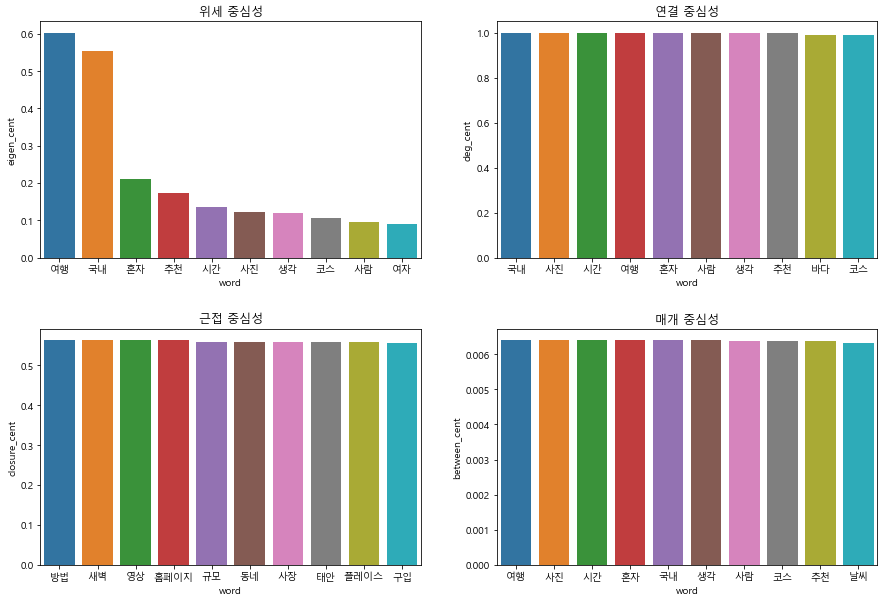

In [42]:
# 각 중심성별로 상위 10개의 단어를 시각화하겠습니다.

fig, ax = plt.subplots(2,2, figsize = (15,10))

sns.barplot(data = df_sorted_eig.head(10), x = 'word', y= 'eigen_cent', ax = ax[0][0])
sns.barplot(data = df_sorted_deg.head(10), x = 'word', y= 'deg_cent', ax = ax[0][1])
sns.barplot(data = df_sorted_clo.head(10), x = 'word', y= 'closure_cent', ax = ax[1][0])
sns.barplot(data = df_sorted_betw.head(10), x = 'word', y= 'between_cent', ax = ax[1][1])

ax[0][0].set_title('위세 중심성')
ax[0][1].set_title('연결 중심성')
ax[1][0].set_title('근접 중심성')
ax[1][1].set_title('매개 중심성')
plt.subplots_adjust(hspace = 0.3)

### 네트워크 그림

* networkx에서 기본적으로 제공하는 시각화 레이아웃 중 spring layout을 사용하겠습니다.


* node size는 위세 중심성을 기초로 설정했습니다.

Text(0.5, 1.0, 'Spring Layout')

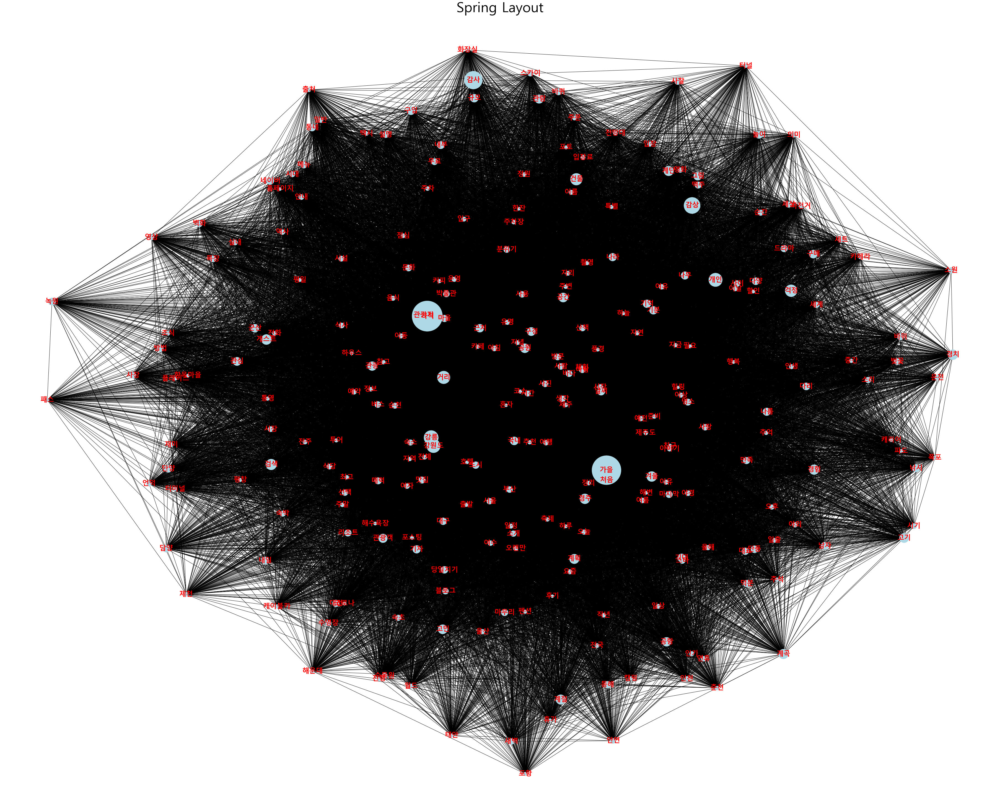

In [43]:
# 생성된 연결망 데이터를 시각화하겠습니다.

import matplotlib.pyplot as plt

plt.figure(figsize=(50, 40))

nx.draw_spring(travel_network, labels = travel_id2word, font_family = 'Malgun Gothic', font_color='red',
               node_color = ['lightblue'], node_size = [v * 20000 for _,v in list(sorted_eig)], font_size=25, font_weight='bold')
plt.title('Spring Layout', fontsize = 50)

* 위세 중심성은 연결된 단어의 연결성까지도 계산함으로 연결된 단어가 다른 단어와 연결성이 높다면, 해당 단어의 위세 중심성은 높다고 판단하는 중심성이며, 즉 영향력이 높은지를 측정합니다.


* 결과는 아래와 같습니다.


    - 네트워크 지도에서 노드 크기가 큰 단어를 살펴보면, 강원도, 경주, 강릉, 가격, 가을, 감상 등으로 나타났습니다.


    - 네트워크 지도에 포함된 지역을 살펴보면, 제주, 강원도(강릉, 춘천, 속초, 평창-대관령, 동해), 부산(해운대), 인천, 태안, 군산, 여수, 울산, 통영, 포항 등 바닷가 인접 지역이 많이 포함되었습니다. 이외, 대구, 서울, 순천, 경주, 전주(한옥마을), 단양, 제천, 대전 등 대도시를 포함한 다양한 도시들도 포함되었습니다. 결과를 종합하면, **바다**라는 키워드를 중심으로 사람들은 항구도시를 여행지로 선호하는 것으로 보였으며, 그 외 대구, 서울, 경주, 전주 등 대도시 및 옛 전통이 깃든 도시도 많은 사람이 찾는 것으로 보여집니다.


    - 여행에서의 계획을 짤 때 고려하는 사항은 맛집, 카페, 숙소, 거리, 날씨 등의 중요도가 높은 것으로 나타났으며, 그 중에서도 맛집, 카페 등 먹거리에 대한 관심이 높은 것으로 보여졌습니다.

### 커뮤니티 탐지

In [44]:
# 커뮤니티를 찾기 위한 modularity 를 계산하겠습니다.

from community import community_louvain

# 노드 속성을 기초로 파티션을 나누겠습니다.
partition = community_louvain.best_partition(travel_network)

# partition 값을 통해 노드가 잘 구분되어 있는지를 계산하겠습니다.
modularity = community_louvain.modularity(partition, travel_network)
print('Modularity:', modularity)

Modularity: 0.10398135058924372


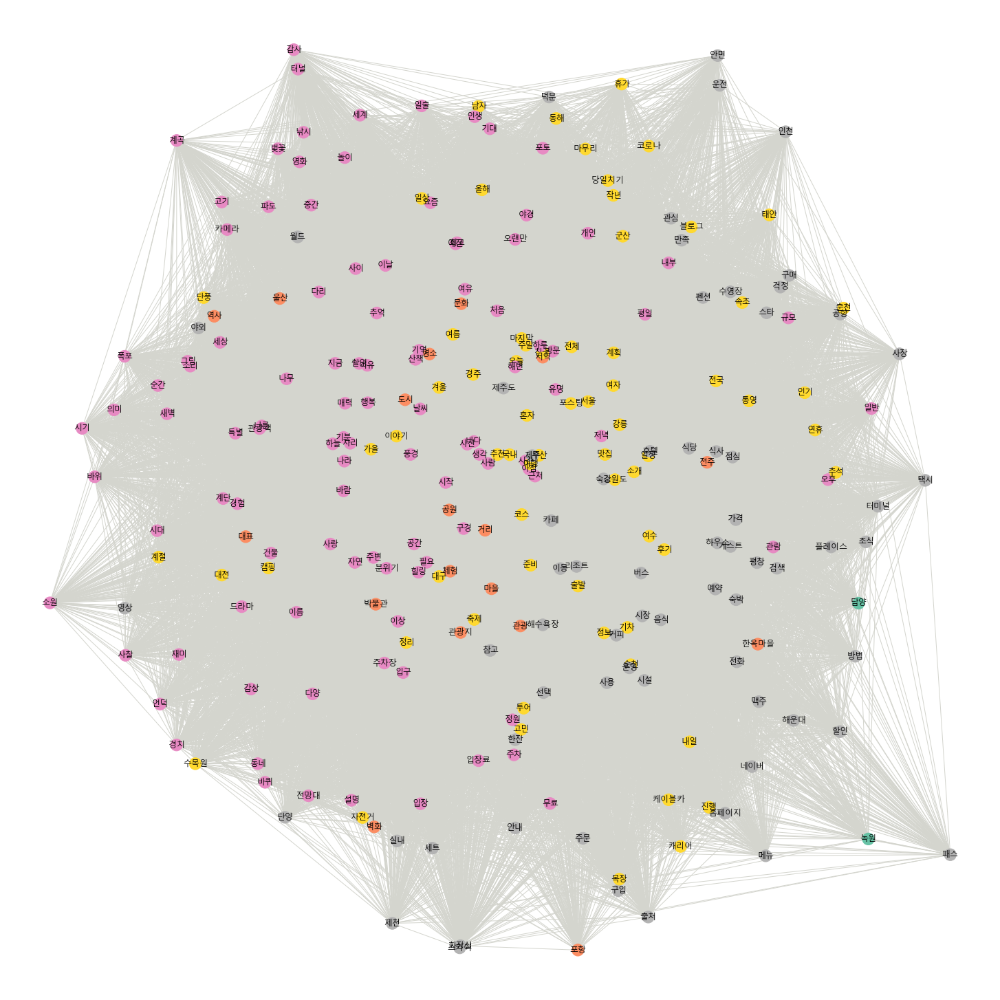

In [45]:
plt.figure(figsize=(20, 20))

colors = [partition[n] for n in travel_network.nodes()]
my_colors = plt.cm.Set2_r
nx.draw(travel_network, with_labels = True, labels = travel_id2word, font_family = 'Malgun Gothic', 
        node_color=colors, cmap = my_colors, font_size = 12, edge_color = "#D4D5CE")

**커뮤니티 탐지 결과, 5개의 커뮤니티로 나누어졌습니다. 아래에서 엘보우 기법을 활용하여 최적의 군집을 확인해보겠습니다.**

In [46]:
from sklearn.cluster import KMeans
from gensim.models import Word2Vec
from sklearn.manifold import TSNE

In [47]:
travel_nouns = [list(vocab_dict.keys())]

travel_nouns

[['여행',
  '국내',
  '사진',
  '시간',
  '생각',
  '사람',
  '혼자',
  '추천',
  '바다',
  '코스',
  '카페',
  '호텔',
  '마을',
  '공원',
  '경주',
  '풍경',
  '시작',
  '버스',
  '구경',
  '축제',
  '서울',
  '부산',
  '날씨',
  '제주',
  '가을',
  '맛집',
  '여수',
  '강원도',
  '겨울',
  '제주도',
  '숙소',
  '여름',
  '준비',
  '체험',
  '아침',
  '거리',
  '포스팅',
  '출발',
  '처음',
  '강릉',
  '전주',
  '바람',
  '소개',
  '자연',
  '이야기',
  '예약',
  '시장',
  '유명',
  '해변',
  '여자',
  '순천',
  '방문',
  '공간',
  '이동',
  '기분',
  '계획',
  '자리',
  '커피',
  '관광',
  '친구',
  '대구',
  '해수욕장',
  '산책',
  '지역',
  '펜션',
  '하늘',
  '저녁',
  '기차',
  '전체',
  '힐링',
  '일정',
  '나무',
  '촬영',
  '사용',
  '근처',
  '군산',
  '입구',
  '식당',
  '하루',
  '이상',
  '울산',
  '하우스',
  '나라',
  '기억',
  '추억',
  '속초',
  '행복',
  '주말',
  '정보',
  '분위기',
  '통영',
  '벚꽃',
  '가격',
  '박물관',
  '문화',
  '주차장',
  '마지막',
  '캠핑',
  '주변',
  '여유',
  '나름',
  '이름',
  '리조트',
  '게스트',
  '캐리어',
  '주차',
  '블로그',
  '사랑',
  '음식',
  '도시',
  '정원',
  '관광지',
  '후기',
  '다리',
  '지금',
  '건물',
  '바위',
  '필요',
  '오늘',
  '내일',
  '단풍',
  '식사',
  '소리',


In [48]:
travel_word2vec = Word2Vec(travel_nouns, min_count= 1)

In [49]:
travel_vocab = travel_word2vec.wv.vocab
travel_similarity = travel_word2vec[travel_vocab]

<ipython-input-49-a8efc8a03d39>:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  travel_similarity = travel_word2vec[travel_vocab]


In [50]:
# TSNE 라이브러리를 활용하여 특징 선택 방법을 통한 차원 축소를 실시하겠습니다.
travel_tsne = TSNE(n_components=2)

In [51]:
travel_transform_similarity = travel_tsne.fit_transform(travel_similarity)
travel_df = pd.DataFrame(travel_transform_similarity, index = travel_vocab, columns=['x', 'y'])

travel_df.head()

,x,y
여행,-6.688224,6.319344
국내,-6.133936,-5.856430
사진,1.797320,7.797969
시간,-4.604087,-13.174553
생각,-8.281528,-1.822582


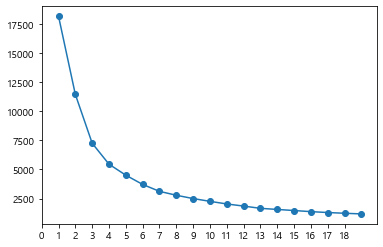

In [52]:
# 엘보우 기법을 통해 적절한 클러스터 개수를 구하겠습니다.

def elbow(x):
    distortions  = []
    for i in range(1,20):
        km = KMeans(n_clusters = i, init='k-means++', random_state = 33)
        km.fit(x)
        distortions.append(km.inertia_)
    
    plt.plot(range(1,20), distortions, marker='o')
    ticks = plt.xticks(range(len(distortions)))
    plt.show()
    
elbow(travel_df)

**엘보우 기법을 통해 최적의 클러스터 개수는 5임을 확인했으며 위의 커뮤니티 갯수와 일치하는 것으로 나타났습니다.**

In [53]:
travel_kmeans = KMeans(n_clusters = 5)
travel_predict = travel_kmeans.fit_predict(travel_df)
travel_predict

array([4, 1, 0, 2, 1, 4, 0, 1, 2, 3, 3, 2, 1, 4, 4, 1, 4, 1, 0, 4, 1, 1,
       2, 2, 4, 1, 0, 3, 2, 2, 0, 3, 1, 0, 2, 2, 3, 1, 0, 4, 1, 3, 1, 1,
       4, 1, 3, 4, 2, 3, 0, 3, 3, 3, 2, 0, 2, 0, 1, 1, 2, 0, 4, 4, 3, 2,
       4, 4, 3, 1, 1, 1, 2, 2, 0, 0, 2, 4, 0, 3, 2, 0, 0, 3, 4, 1, 3, 3,
       2, 4, 0, 3, 0, 3, 4, 4, 0, 2, 4, 1, 0, 3, 1, 4, 3, 2, 3, 3, 4, 2,
       1, 4, 1, 1, 4, 1, 3, 4, 3, 4, 4, 4, 0, 0, 3, 3, 0, 4, 3, 4, 2, 0,
       1, 2, 0, 3, 4, 1, 2, 0, 1, 0, 4, 4, 1, 2, 2, 1, 0, 0, 2, 3, 4, 4,
       4, 0, 3, 3, 4, 3, 4, 2, 3, 1, 3, 2, 2, 0, 0, 2, 4, 4, 3, 3, 4, 4,
       2, 0, 1, 0, 1, 3, 1, 4, 0, 0, 0, 2, 3, 3, 4, 2, 0, 3, 2, 2, 4, 3,
       3, 3, 1, 4, 1, 3, 2, 1, 0, 3, 1, 2, 4, 0, 3, 4, 1, 0, 1, 0, 4, 1,
       4, 3, 3, 3, 0, 0, 2, 4, 4, 2, 3, 4, 3, 1, 1, 2, 0, 2, 0, 3, 3, 1,
       4, 4, 1, 2, 2, 2, 1, 2, 3, 0, 2, 2, 3, 3, 0, 2, 4, 2, 0])

In [54]:
travel_results = travel_df
travel_results['predict'] = travel_predict
travel_results

,x,y,predict
여행,-6.688224,6.319344,4
국내,-6.133936,-5.856430,1
사진,1.797320,7.797969,0
시간,-4.604087,-13.174553,2
생각,-8.281528,-1.822582,1
...,...,...,...
녹원,0.945406,6.076864,0
일반,-2.356664,-5.271410,2
구입,-9.177779,0.608056,4
남자,1.146227,-12.136664,2


In [55]:
# 클러스터별(0~4)로 묶인 단어 20개를 출력하는 함수를 만들겠습니다.
# 0번 클러스터에 속한 단어를 확인하겠습니다.

def cluster_output(data, cluster):
    return data[data['predict'] == cluster].head(20)

cluster_output(travel_results, 0)

,x,y,predict
사진,1.797320,7.797969,0
혼자,-0.698809,5.603157,0
구경,8.153193,8.726678,0
여수,-0.158664,4.482790,0
숙소,0.701162,4.757169,0
체험,-0.561072,7.262273,0
처음,2.610733,3.212120,0
순천,2.640175,3.543607,0
계획,-0.650448,8.727174,0
커피,1.207725,2.733424,0


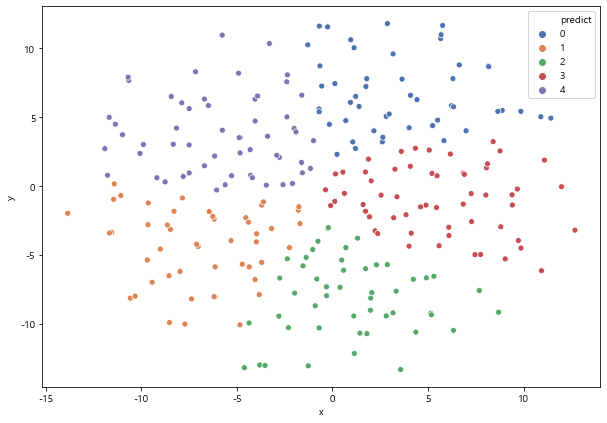

In [56]:
plt.figure(figsize = (10, 7))
plt.rc('axes', unicode_minus = False)
ax = sns.scatterplot(x = 'x', y = 'y', data = travel_results, hue = 'predict', palette='deep')
plt.legend(loc = 'best')

In [57]:
# 싸이킷런의 Kmeans는 거리 측정 방식을 바꿀 수 없습니다.
# 그래서 정규화 후에 Kmeans를 수행하면 코사인 유사도를 사용하는 것과 비슷해집니다.

from sklearn.preprocessing import Normalizer

nom = Normalizer(copy=False)
pos = nom.fit_transform(travel_df)

km = KMeans(n_clusters=5, random_state=1234)
labels_nom = km.fit_predict(travel_df)

labels_nom

array([4, 2, 3, 1, 2, 4, 3, 2, 1, 0, 0, 1, 2, 4, 4, 2, 4, 2, 3, 4, 2, 2,
       1, 1, 4, 2, 3, 0, 1, 1, 3, 0, 2, 3, 1, 1, 0, 2, 3, 4, 2, 0, 2, 2,
       4, 2, 0, 4, 1, 0, 3, 0, 0, 0, 1, 3, 1, 3, 2, 2, 1, 3, 4, 4, 0, 1,
       4, 4, 0, 2, 2, 2, 1, 1, 3, 3, 1, 4, 3, 0, 1, 3, 3, 0, 4, 2, 0, 0,
       1, 4, 3, 0, 3, 0, 4, 4, 3, 1, 4, 2, 3, 0, 2, 4, 0, 1, 0, 0, 4, 1,
       2, 4, 2, 2, 4, 2, 0, 4, 0, 4, 4, 4, 3, 3, 0, 0, 3, 4, 0, 4, 1, 3,
       2, 1, 3, 0, 4, 2, 1, 3, 2, 3, 4, 4, 2, 1, 1, 2, 3, 3, 1, 0, 4, 4,
       4, 3, 0, 0, 4, 0, 4, 1, 0, 2, 0, 1, 1, 3, 3, 1, 4, 4, 0, 0, 4, 4,
       1, 3, 2, 3, 2, 0, 2, 4, 3, 3, 3, 1, 0, 0, 4, 1, 3, 0, 1, 1, 4, 0,
       0, 0, 2, 4, 2, 0, 1, 2, 3, 0, 2, 1, 4, 3, 0, 4, 2, 3, 2, 3, 4, 2,
       4, 0, 0, 0, 3, 3, 1, 4, 4, 1, 0, 4, 0, 2, 2, 1, 3, 1, 3, 0, 0, 2,
       4, 4, 2, 1, 1, 1, 2, 1, 0, 3, 1, 1, 0, 0, 3, 1, 4, 1, 3])

In [58]:
travel_results = travel_df
travel_results['predict'] = labels_nom

In [59]:
travel_transform_similarity = travel_tsne.fit_transform(travel_similarity)
travel_df = pd.DataFrame(travel_transform_similarity, index = travel_vocab, columns=['x', 'y'])

travel_df.head()

,x,y
여행,-6.150665,7.715915
국내,-2.303120,5.651243
사진,3.314172,10.992398
시간,-10.814606,7.646183
생각,-1.076061,9.166741


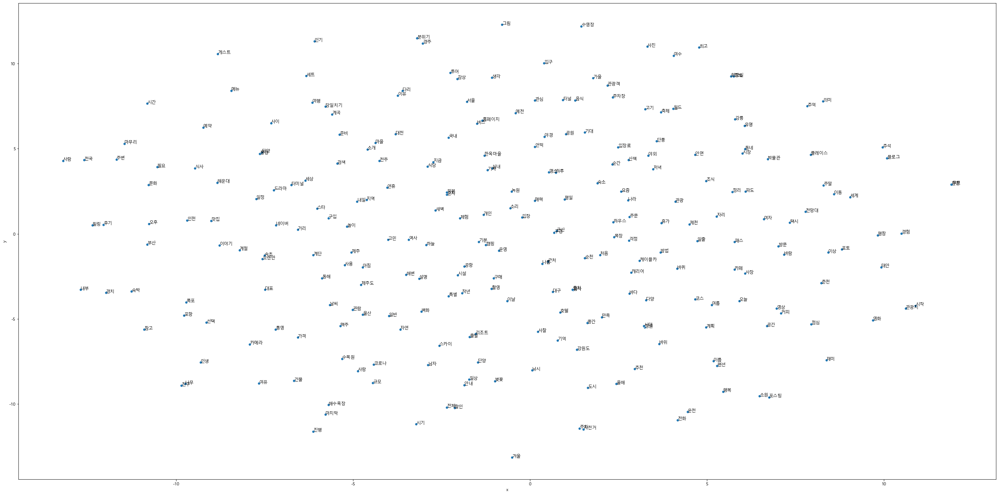

In [60]:
%matplotlib inline

plt.figure(figsize = (40, 20))
ax = sns.scatterplot(travel_df["x"], travel_df["y"])

for word, pos in travel_df.iterrows():
    ax.annotate(word, pos)
plt.show()

In [81]:
# # 클러스터별로 묶인 단어 20개를 출력하는 함수를 만들겠습니다.
# # 1번 클러스터에 속한 단어를 확인하겠습니다.

# def norm_cluster_output(data, cluster):
#     return data[data['predict'] == cluster].head(20)

# norm_cluster_output(travel_results, 2)

,x,y,predict
국내,-6.133936,-5.856430,2
생각,-8.281528,-1.822582,2
추천,-13.843014,-1.967865,2
마을,-4.714500,-5.663129,2
풍경,-3.692379,-1.375297,2
버스,-7.018121,-4.384336,2
서울,-8.996576,-4.570050,2
부산,-9.677201,-5.360548,2
맛집,-7.966314,-6.191834,2
준비,-3.695313,-5.532966,2


# 유사도

## 문서 간 유사도

In [62]:
# TF-IDF 값을 활용하여 문서 간 코사인 유사도를 구하겠습니다.

from sklearn.metrics.pairwise import linear_kernel

cosine_sim = linear_kernel(df_tfidv)

cosine_sim_df = pd.DataFrame(cosine_sim)

cosine_sim_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981
0,1.000000,0.189394,0.238366,0.034643,0.219803,0.101447,0.008954,0.111221,0.087650,0.088871,0.308407,0.095546,0.137145,0.146006,0.012434,0.055048,0.250739,0.170941,0.228575,0.142877,0.173402,0.229014,0.168982,0.290085,0.075378,...,0.195837,0.123091,0.222681,0.123091,0.053317,0.375534,0.021845,0.000000,0.087039,0.205331,0.131590,0.275241,0.123091,0.107958,0.201456,0.084440,0.031782,0.221565,0.092319,0.077850,0.023262,0.399275,0.205718,0.319112,0.038925
1,0.189394,1.000000,0.079455,0.012991,0.135263,0.033816,0.008954,0.029944,0.109562,0.038088,0.051401,0.011943,0.194289,0.132733,0.055954,0.027524,0.026394,0.085470,0.434293,0.000000,0.856171,0.022901,0.036210,0.061070,0.138193,...,0.032640,0.061546,0.000000,0.143607,0.005332,0.051209,0.021845,0.018557,0.101545,0.064166,0.115142,0.082572,0.061546,0.070173,0.067152,0.063330,0.143019,0.110782,0.076932,0.019462,0.058155,0.127042,0.057144,0.046928,0.000000
2,0.238366,0.079455,1.000000,0.009083,0.106399,0.106399,0.018781,0.035892,0.076606,0.053262,0.107820,0.475993,0.095893,0.153133,0.013041,0.000000,0.027682,0.059761,0.095893,0.000000,0.102299,0.160128,0.075955,0.064051,0.105409,...,0.022822,0.215166,0.000000,0.172133,0.106246,0.250640,0.045823,0.000000,0.091287,0.161515,0.069007,0.057735,0.000000,0.045291,0.070430,0.265684,0.066667,0.025820,0.161374,0.040825,0.073193,0.171312,0.023973,0.078750,0.000000
3,0.034643,0.012991,0.009083,1.000000,0.077317,0.144970,0.005118,0.166272,0.592862,0.014514,0.176287,0.022756,0.078393,0.121393,0.007107,0.078665,0.132009,0.141138,0.013065,0.114337,0.024779,0.104725,0.096591,0.514896,0.043086,...,0.099504,0.046907,0.084857,0.070360,0.030476,0.058543,0.006243,0.000000,0.082920,0.014671,0.056413,0.000000,0.035180,0.043197,0.046061,0.024133,0.018167,0.126648,0.017590,0.022250,0.066484,0.041496,0.091458,0.139487,0.022250
4,0.219803,0.135263,0.106399,0.077317,1.000000,0.075472,0.399660,0.143208,0.211922,0.028335,0.213050,0.035540,0.229565,0.311051,0.041627,0.061430,0.184082,0.275538,0.076522,0.170068,0.145127,0.153337,0.242448,0.119262,0.252347,...,0.169975,0.183147,0.124247,0.274721,0.029749,0.190485,0.036566,0.000000,0.129505,0.143208,0.256978,0.000000,0.137361,0.180710,0.254784,0.094229,0.212798,0.164833,0.206041,0.260623,0.077876,0.101264,0.204058,0.125684,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,0.023262,0.058155,0.073193,0.066484,0.077876,0.233628,0.054986,0.157622,0.134568,0.000000,0.022547,0.024448,0.175466,0.101892,0.076360,0.253546,0.010131,0.087482,0.000000,0.000000,0.049917,0.000000,0.037062,0.070321,0.115728,...,0.033408,0.062994,0.000000,0.125988,0.000000,0.104828,0.033539,0.000000,0.044544,0.000000,0.101015,0.000000,0.000000,0.066299,0.020620,0.032410,0.048795,0.377964,0.141737,0.059761,1.000000,0.027864,0.035093,0.000000,0.239046
978,0.399275,0.127042,0.171312,0.041496,0.101264,0.101264,0.032174,0.153719,0.139985,0.182490,0.272665,0.114447,0.082138,0.111294,0.417029,0.098907,0.324052,0.250259,0.136896,0.182550,0.103852,0.219455,0.202410,0.237743,0.210675,...,0.182450,0.245737,0.311188,0.245737,0.172433,0.408930,0.052333,0.088911,0.104257,0.122975,0.236433,0.197814,0.221163,0.129315,0.289570,0.126430,0.038069,0.029488,0.073721,0.046625,0.027864,1.000000,0.273793,0.134908,0.046625
979,0.205718,0.057144,0.023973,0.091458,0.204058,0.153043,0.013507,0.309761,0.176304,0.191530,0.598193,0.036035,0.103448,0.100120,0.037516,0.166091,0.706756,0.487108,0.172414,0.431086,0.114447,0.368523,0.473432,0.391555,0.113715,...,0.426746,0.371391,0.727860,0.123797,0.209127,0.463524,0.098867,0.055989,0.087538,0.154881,0.397033,0.000000,0.464238,0.260585,0.364698,0.031846,0.143839,0.037139,0.046424,0.000000,0.035093,0.27

In [63]:
# 가장 유사한 문서를 찾는 함수를 만들겠습니다.

def most_similar(x, index):
    x = x.loc[index].sort_values(ascending = False).head(2)

    return x.tail(1)

most_similar(cosine_sim_df, 1)

619    0.857244
Name: 1, dtype: float64

**예시로, 1번 문서와 가장 유사한 문서는 619번 문서이고 유사도는 0.857 으로 나타났습니다.**

## 단어 간 유사도

In [64]:
dataset = []
for i in han_contents:
    dataset.append(mecab.nouns(i))
dataset = [[y for y in x if len(y) >= 2] for x in dataset]
dataset = [[y for y in x if y not in stop_words] for x in dataset]

dataset[:5]

[['여행',
  '국내',
  '여행',
  '양양',
  '여행',
  '비앤비',
  '서피',
  '비치',
  '국내',
  '여행',
  '양양',
  '여행',
  '비앤비',
  '서피',
  '비치',
  '평화',
  '식사',
  '자리',
  '여행',
  '사람',
  '바다',
  '한마디',
  '강원도',
  '양양',
  '숙소',
  '양양',
  '비앤비',
  '여행',
  '추진력',
  '대박',
  '리스트',
  '얘기',
  '결제',
  '마지막',
  '주말',
  '여행',
  '시작',
  '국내',
  '여행',
  '강원도',
  '양양',
  '양양',
  '선택',
  '이유',
  '서피',
  '비치',
  '양양',
  '해변가',
  '동해',
  '바다',
  '한곳',
  '나라',
  '여행',
  '기간',
  '날씨',
  '기분',
  '양양',
  '양양',
  '노래',
  '주변',
  '극찬',
  '강원도',
  '양양',
  '서피',
  '비치',
  '이야기',
  '양양',
  '숙소',
  '에어',
  '비앤비',
  '예약',
  '하조대',
  '해수욕장',
  '근처',
  '비앤비',
  '하조대',
  '해수욕장',
  '도보',
  '양양',
  '서피',
  '비치',
  '도보',
  '인천',
  '양양',
  '시간',
  '운전',
  '오구',
  '고생',
  '에어',
  '비앤비',
  '빌리',
  '버블',
  '단점',
  '여행',
  '생각',
  '숙소',
  '정보',
  '주시',
  '요바',
  '숙소',
  '해프닝',
  '예약',
  '이야기',
  '궁금증',
  '유발',
  '거실',
  '단점',
  '소파',
  '불편',
  '일자',
  '침실',
  '침실',
  '햇살',
  '매트리스',
  '스프링',
  '상태',
  '하룻밤',
  '편안',
  '침실',
  '침실',
  '거실',
  '티

* Word2Vec(data = data, size = 벡터의 차원, window = 주변단어 범위, min_count = 최소 빈도 설정, workers = 실행할 병렬 프로세스의 수, sg = 단어 예측방식(0 == CBOW, 1 == skip-gram))

In [65]:
# word2Vec : 언어의 의미와 유사도를 고려하여 언어를 벡터로 매핑하는 방식을 사용하는 패키지 중 하나
from gensim.models import Word2Vec

model = Word2Vec(dataset, window = 5, min_count= 2, sg = 1)
model.init_sims(replace = True)  # 트레이닝이 완료되면 init_sims 명령으로 필요없는 메모리를 unload 시킨다.

In [66]:
print(f"대구와 부산 두 단어 간 유사도 : {model.wv.similarity('대구', '부산')}")

대구와 부산 두 단어 간 유사도 : 0.43210986256599426


In [67]:
# 유사도를 테이블로 출력하는 함수를 만들겠습니다.
def sim_table(x):
    return pd.DataFrame(model.wv.most_similar(x, topn = 100), columns = ['단어', '유사도'])

df = sim_table('바다')
df.head()

,단어,유사도
0,모래사장,0.896286
1,모래,0.882431
2,동해,0.870708
3,몽돌,0.865372
4,바닷바람,0.858308


In [68]:
# 전국 20개 여행지역을 리스트로 저장하고, '바다' 유사어 중 포함여부를 측정해 봤습니다.

city_list = ['서울', '부산', '대구', '경주', '제주', '춘천', '전주','양양', '동해', '인천', '대관령', '강릉', '군산', '울산',
             '전주', '여수', '순천', '경주', '속초', '통영']
df = df[df['단어'].isin(city_list)]
df

,단어,유사도
2,동해,0.870708


**전국 여행지역 20곳을 기준으로 공통되는 키워드를 찾았으나 '바다'라는 키워드에서만 동해와 양양이 출력되었습니다. 혼행족이 많이 다니는 여행지 간의 공통적인 요소를 찾기 힘들었습니다. 각 여행지마다 고유의 특색이 담긴 세부적인 지명과 음식 이름 등이 많이 출력되었습니다.**

In [69]:
# from konlpy.tag import Kkma

# kkma = Kkma()

In [70]:
# sentences = []
# list_vec = []

# for da in data:
#     sentences.append(kkma.sentences(da[0]))
#     for s in sentences:
#         for w in s:
#             list_vec.append(mecab.nouns(w))

In [71]:
# word_list = []

# for l in list_vec:
#     empty_vec = []
#     for w in l:
#         if len(w)>=2:
#             empty_vec.append(w)
#     word_list.append(empty_vec)

In [72]:
# travel_vocab = model.wv.vocab
# travel_similarity = model[travel_vocab]

In [73]:
# TSNE 라이브러리를 활용하여 특징 선택 방법을 통한 차원 축소를 실시하겠습니다.
# from sklearn.manifold import TSNE

# travel_tsne = TSNE(n_components=2)

In [74]:
# word_vectors = model.wv.syn0 # 어휘의 feature vector, 'syn0'이라는 넘파이 배열로 저장
#                              # syn0의 행 수는 모델 어휘의 단어 수
# num_clusters = int(word_vectors.shape[0]/50) # 어휘 크기의 1/5나 평균 5단어
# print(num_clusters)
# num_clusters = int(num_clusters)

# kmeans_clustering = KMeans(n_clusters=num_clusters)
# idx = kmeans_clustering.fit_predict(word_vectors)

# idx = list(idx)
# names = model.wv.index2word
# word_centroid_map = {names[i]: idx[i] for i in range(len(names))}

# for c in range(num_clusters):
#     # 클러스터 번호를 출력
#     print("\ncluster {}".format(c))
    
#     words = []
#     cluster_values = list(word_centroid_map.values())
#     for i in range(len(cluster_values)):
#         if (cluster_values[i] == c):
#             words.append(list(word_centroid_map.keys())[i])            
#     print(words)

In [75]:
# travel_transform_similarity = travel_tsne.fit_transform(travel_similarity)
# travel_df = pd.DataFrame(travel_transform_similarity, index = travel_vocab, columns=['x', 'y'])

# travel_df.head()

In [76]:
# from sklearn.cluster import KMeans
# from sklearn.cluster import AgglomerativeClustering

In [77]:
# %matplotlib inline

# plt.figure(figsize = (40, 20))
# ax = sns.scatterplot(travel_df["x"], travel_df["y"])

# for word, pos in travel_df.iterrows():
#     ax.annotate(word, pos)
# plt.show()